# Field-level Bayesian inference with Enzyme and Hamiltonian Monte Carlo

This notebook demonstrates **field-level Bayesian inference** through a combined JAX + Fortran simulation pipeline composed of **two coupled Tesseracts**. Starting from a Gaussian white-noise field, **Disco-DJ** evolves the field into a three-dimensional matter distribution using Lagrangian perturbation theory. A second Fortran code converts that density field into synthetic observations of the **Lyman-alpha forest** using the **Fluctuating Gunn-Peterson Approximation (FGPA)**. Derivatives of the forward model through the Fortran code are obtained automatically with **Enzyme**, enabling **gradient-based posterior sampling** with **Hamiltonian Monte Carlo (HMC)**. The resulting posterior contains many thousand latent field parameters in addition to a global model parameter, making it a challenging high-dimensional inference problem. The HMC sampling can run on a laptop GPU; however, at resolution $64^3$ this will take several hours.

### What this notebook demonstrates

- **Automatic differentiation through Fortran code** using Enzyme.
- **Field-level HMC** over a high-dimensional latent field together with a global model parameter.
- **Coupling multiple scientific codes** into a differentiable inference pipeline.

## Physical background

Light from distant quasars passes through diffuse hydrogen gas on its way to Earth. Neutral hydrogen absorbs photons at the Lyman-alpha transition, imprinting a characteristic pattern of absorption features in the observed spectrum known as the **Lyman-alpha forest**. Each spectrum probes a one-dimensional line of sight through the three-dimensional matter distribution; in simulations these lines of sight are commonly called **skewers**.

The FGPA provides a simple phenomenological model relating matter density to transmitted flux,

```text
F = exp(-A (1 + δ)^β)
```

where

- `F` is the transmitted flux,
- `δ` is the matter density contrast (so `ρ = 1 + δ`),
- `A = exp(log_A)` controls the overall absorption strength,
- `β` controls the density dependence.

In this notebook, `β` is fixed and we infer `log_A` jointly with the initial white-noise field. This creates a realistic inference problem containing both a high-dimensional latent field and a global physical parameter.

The overall model looks as follows:
![Model](workflow.png)

*Note:* the circular shape of the white noise field in Fourier space is because we do not include corner modes beyond the one-dimensional Nyquist mode. The unequal Fourier shape of $N \times N \times (N / 2 + 1)$ comes from the rFFT layout, which leverages the conjugate symmetry of the Fourier modes of the (real-valued) density field to reduce memory.

In [1]:
import json
import os
os.environ.setdefault("XLA_PYTHON_CLIENT_PREALLOCATE", "false")
from pathlib import Path
import sys
import jax
jax.config.update("jax_enable_x64", False)
import jax.numpy as jnp
from jax.flatten_util import ravel_pytree
import blackjax
import matplotlib as mpl
mpl.rcParams["savefig.format"] = "pdf"
import matplotlib.pyplot as plt
import numpy as np
import hashlib
from PIL import Image
from scipy.optimize import minimize
from tqdm.auto import tqdm
from tesseract_core import Tesseract
from tesseract_jax import apply_tesseract

# Find notebook root
ROOT = Path.cwd().resolve()
for parent in [ROOT, *ROOT.parents]:
    candidate = parent / "discodj_tesseract_example" / "enzyme_fgpa_loga"
    if candidate.exists():
        ROOT = parent
        EXAMPLE_DIR = candidate
        break
else:
    raise RuntimeError("could not locate discodj_tesseract_example/enzyme_fgpa_loga")

if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from discodj.core.summary_statistics import cross_power_spectrum
from discodj_tesseract_example.common.density import log_density_for_plot
from discodj_tesseract_example.common.fourier import linear_delta_from_white_noise_modes

OUTPUT_ROOT = EXAMPLE_DIR / "outputs"
TARGET_ROOT = EXAMPLE_DIR / "targets"
OUTPUT_ROOT.mkdir(exist_ok=True)
TARGET_ROOT.mkdir(exist_ok=True)

print("ROOT", ROOT)
print("jax", jax.__version__, "backend", jax.default_backend())
print("blackjax", blackjax.__version__)

ROOT /home/flo/Documents/Projects/DiscoDJ-Tesseract-Demo


#### Define the settings

In [2]:
TARGET_TAG = "target_res_64_std_0p03_noisy"  # selects the generated target bundle under targets/
RUN_TAG = "run_res_64_std_0p03_noisy_10_steps_final"  # separates caches/figures for this notebook run
TARGET_BUNDLE_PATH = TARGET_ROOT / TARGET_TAG / "target_bundle.npz"
RUN_OUTPUT_DIR = OUTPUT_ROOT / RUN_TAG
RUN_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
FIELD_DTYPE = jnp.float32  # keep target generation, Tesseracts, MAP, and HMC in single precision
RNG_SEED = 271828  # notebook-side random seed for posterior draw selection etc.
key = jax.random.PRNGKey(RNG_SEED)

OBSERVATION_KINDS = ["noisy"]  # normally use noisy observations as targets; clean is useful for diagnostics
PRIOR_SCALING = 1.0  # keep Bayesian posterior weighting unchanged

# MAP settings: for finding an approximate starting point for the HMC chain
RUN_MAP = True  # run or load MAP stages used to initialize HMC
RUN_HMC = True  # run or load HMC adaptation and samples
MAP_MAXITER = 1000  # only used if staged MAP is disabled
MAP_PROGRESS_EVERY = 5  # print scalar diagnostics every N steps
MAP_LOG_A_SCALE = 0.1  # rescales log_A during L-BFGS for better conditioning
MAP_USE_FIELD_PRECONDITIONER = True  # precondition field coordinates using linear theory
MAP_PRECONDITIONER_STRENGTH = 1.0  # 1.0 applies the full heuristic preconditioner
MAP_PRECONDITIONER_FLOOR = 1.0
MAP_PRECONDITIONER_CLIP = (1.0e-6, 1.0e6)
MAP_USE_STAGES = True  # optimize increasingly many Fourier modes before full-resolution MAP
MAP_STAGE_K_FRACTIONS = (0.25, 0.5, 1.0)  # Fourier-support fractions used by staged MAP
MAP_STAGE_MAXITERS = (80, 120, 250)  # L-BFGS iteration limits for the staged MAP passes
MAP_CACHE_MODE = "load_or_run"  # reuse matching MAP caches when available
MAP_CACHE_DIR = RUN_OUTPUT_DIR / "map_cache"

# HMC settings
HMC_WARMUP_STEPS = 2000  # BlackJAX window adaptation steps
HMC_SAMPLE_STEPS = 5000  # total HMC transitions
HMC_BURN_IN = 1000  # discard these initial production transitions from retained samples
HMC_THIN = 25  # retain every Nth post-burn-in production transition
HMC_NUM_INTEGRATION_STEPS = 10  # leapfrog steps per HMC proposal
HMC_INITIAL_STEP_SIZE = 0.005  # initial step size passed to adaptation
HMC_FIXED_STEP_SIZE = 0.005  # used only when running without adaptation
HMC_TARGET_ACCEPTANCE = 0.85  # target acceptance probability for step-size adaptation
HMC_MASS_MATRIX_MODE = "window_adapted"  # use adapted diagonal inverse mass matrix
HMC_LOG_A_INVERSE_MASS = 0.005  # used only by manual log_A mass mode; higher means larger log_A momentum variance
HMC_ADAPTATION_CACHE_MODE = "load_or_run"  # reuse matching warmup/adaptation cache when available
HMC_ADAPTATION_CACHE_DIR = RUN_OUTPUT_DIR / "hmc_adaptation_cache"
HMC_SAMPLE_CACHE_MODE = "load_or_run"  # reuse matching retained HMC samples when available
HMC_SAMPLE_CACHE_DIR = RUN_OUTPUT_DIR / "hmc_sample_cache"
HMC_PROGRESS_EVERY = 10  # print scalar diagnostics every N production steps
HMC_CHECKPOINT_EVERY = 250  # save restartable HMC checkpoints every N production steps
HMC_CHECKPOINT_CACHE_DIR = RUN_OUTPUT_DIR / "hmc_checkpoint_cache"

# Analysis settings
ANALYSIS_DRAWS = 16  # number of retained posterior fields used in downstream plots/GIFs
FOURIER_BINS = 16  # radial bins for Fourier-space diagnostics

#### Load and process the target bundle

In [3]:
if not TARGET_BUNDLE_PATH.exists():
    raise FileNotFoundError(
        f"missing {TARGET_BUNDLE_PATH}. Generate it with: "
        f"uv run python discodj_tesseract_example/enzyme_fgpa_loga/generate_fgpa_loga_target.py "
        f"--target-tag {TARGET_TAG}"
    )
arrays = dict(np.load(TARGET_BUNDLE_PATH, allow_pickle=False))
TARGET_BUNDLE_SHA256 = str(np.asarray(arrays["target_bundle_content_sha256"]))
print(sorted(arrays))
print("target bundle content sha256", TARGET_BUNDLE_SHA256)

true_flux = jnp.asarray(arrays["target_flux_clean"], dtype=FIELD_DTYPE)
noisy_flux = jnp.asarray(arrays["target_flux_noisy"], dtype=FIELD_DTYPE)
true_delta_z = jnp.asarray(arrays["target_delta_z2"], dtype=FIELD_DTYPE)
true_modes = jnp.asarray(arrays["target_base_white_noise_fourier"], dtype=FIELD_DTYPE)
start_modes = jnp.asarray(arrays["initial_white_noise_fourier"], dtype=FIELD_DTYPE)
K_GRID = np.asarray(arrays["k_grid"], dtype=np.float32)
k_grid_jax = jnp.asarray(K_GRID, dtype=FIELD_DTYPE)
LINEAR_POWER_GRID = jnp.asarray(arrays["linear_power_grid"], dtype=FIELD_DTYPE)
rfft_factor_jax = jnp.asarray(arrays["rfft_factor"], dtype=FIELD_DTYPE)
UV_FILTER = np.asarray(arrays["uv_filter"], dtype=bool)
SK_X = jnp.asarray(arrays["skewer_x"], dtype=jnp.int32)
SK_Y = jnp.asarray(arrays["skewer_y"], dtype=jnp.int32)
SK_X_NP = np.asarray(arrays["skewer_x"], dtype=np.int32)
SK_Y_NP = np.asarray(arrays["skewer_y"], dtype=np.int32)
RES = int(np.asarray(arrays["res"]))
BOXSIZE = float(np.asarray(arrays["model_boxsize"]))
CELLSIZE = BOXSIZE / RES
LOG_A_TRUE = float(np.asarray(arrays["log_A_true"]))
LOG_A_INIT = float(np.asarray(arrays["log_A_init"]))
BETA_TRUE = float(np.asarray(arrays["beta_true"]))
FLUX_SIGMA = float(np.asarray(arrays["flux_noise_sigma"]))
N2 = float(np.asarray(arrays["n2"]))
RHO_FLOOR = float(np.asarray(arrays["rho_floor"]))
OMEGA_M_FIXED = float(np.asarray(arrays["omega_m_fixed"]))
MODEL = dict(
    n_steps=int(np.asarray(arrays["model_n_steps"])),
    boxsize=BOXSIZE,
    a_ini=float(np.asarray(arrays["model_a_ini"])),
    a_end=float(np.asarray(arrays["model_a_end"])),
    lpt_order=int(np.asarray(arrays["model_lpt_order"])),
    mass_assignment_order=int(np.asarray(arrays["model_mass_assignment_order"])),
    dynamics_model=str(np.asarray(arrays["model_dynamics_model"])),
    precision=str(np.asarray(arrays["model_precision"])),
)
if MODEL["precision"] != "single":
    raise ValueError(f"this notebook expects a single-precision target bundle, got {MODEL['precision']!r}")
print(f"res={RES}, n_skewers={len(SK_X_NP)}, log_A_true={LOG_A_TRUE:.6f}, log_A_init={LOG_A_INIT:.6f}, beta={BETA_TRUE:.6f}")

target bundle content sha256 35543f69fa0654e9ad1403ff7bff4064e1d874076c2e1ee5f7e67c0193731346
res=64, n_skewers=256, log_A_true=-1.049822, log_A_init=-0.223144, beta=1.600000


#### Build the required Tesseracts

This demo uses two Tesseract images: a DiscoDJ forward model and a Fortran/Enzyme FGPA skewer post-processor. Both have to be built before serving them. To build them from within this notebook, uncomment the following lines.

* The Disco-DJ Tesseract is simple, as Disco-DJ is written in Jax and therefore autodifferentiable. It uses the Zel'dovich approximation for computing the nonlinear density field.
* The FGPA Tesseract is based on Fortran code, which is autodifferentiated via EnzymeAD (https://github.com/EnzymeAD/Enzyme).

The Enzyme-based differentiation works as follows: <br>
The script `discodj_tesseract_example/enzyme_fgpa_loga/fgpa_skewer_tesseract/enzyme/build.sh` turns the Fortran FGPA kernel into LLVM IR, combines it with a C wrapper that requests Enzyme autodiff, runs Enzyme to generate derivative code, optimizes the result, and then emits the library `libfgpa_ad.so`.

While this simple FGPA skewer calculation could be written directly in Jax, the Enzyme-backed Tesseract illustrates how Disco-DJ outputs can be postprocessed by more complex non-JAX codes in realistic workflows.

In [4]:
# import subprocess
#
# TESSERACT_BUILD_PATHS = [
#     EXAMPLE_DIR / "discodj-forward-external-ics-tesseract"
#     EXAMPLE_DIR / "fgpa_skewer_tesseract",
# ]

# for build_path in TESSERACT_BUILD_PATHS:
#     print(f"building {build_path.name} from {build_path}")
#     subprocess.run(["tesseract", "build", str(build_path)], check=True)

In [5]:
forward_tesseract = Tesseract.from_image("discodj-external-ics-forward", gpus=["0"])
fgpa_tesseract = Tesseract.from_image("fgpa-skewer-tesseract")
forward_tesseract.serve()
fgpa_tesseract.serve()
print("served DiscoDJ forward and Enzyme FGPA Tesseracts")

served DiscoDJ forward and Enzyme FGPA Tesseracts


#### Functions for the forward model and objective
The following functions use the Tesseracts to obtain
* the nonlinear density from the linear one (Disco-DJ Tesseract) and
* the Lyman-alpha flux from the nonlinear density (FGPA Tesseract)

In [6]:
def linear_delta_from_modes(white_modes):
    return linear_delta_from_white_noise_modes(white_modes, linear_power_grid=LINEAR_POWER_GRID, k_grid=k_grid_jax, boxsize=BOXSIZE).astype(FIELD_DTYPE)


def forward_density_from_linear(delta_linear):
    outputs = apply_tesseract(
        forward_tesseract,
        inputs=dict(delta_ini=delta_linear.astype(FIELD_DTYPE), omega_m=jnp.asarray(OMEGA_M_FIXED, dtype=FIELD_DTYPE), **MODEL),
    )
    return jnp.asarray(outputs["result"], dtype=FIELD_DTYPE)


def fgpa_flux_from_density(delta_z, log_A):
    outputs = apply_tesseract(
        fgpa_tesseract,
        inputs=dict(
            delta_field=delta_z.astype(FIELD_DTYPE),
            log_A=jnp.asarray(log_A, dtype=FIELD_DTYPE),
            beta=jnp.asarray(BETA_TRUE, dtype=FIELD_DTYPE),
            skewer_x=SK_X,
            skewer_y=SK_Y,
            rho_floor=jnp.asarray(RHO_FLOOR, dtype=FIELD_DTYPE),
        ),
    )
    return jnp.asarray(outputs["flux_skewers"], dtype=FIELD_DTYPE)


def full_forward_model(white_modes, log_A):
    delta_linear = linear_delta_from_modes(white_modes)
    delta_z = forward_density_from_linear(delta_linear)
    flux = fgpa_flux_from_density(delta_z, log_A)
    return delta_linear, delta_z, flux


def flux_target(kind):
    if kind == "clean":
        return true_flux
    if kind == "noisy":
        return noisy_flux
    raise ValueError(kind)

#### Bayesian inference problem

We infer the initial Fourier white-noise field $\epsilon$ and the FGPA amplitude parameter $\log A$ from the observed skewer fluxes $F_{\rm obs}$. Bayes' theorem gives for the posterior

$$
p(\epsilon, \log A \mid F_{\rm obs}) \propto p(F_{\rm obs} \mid \epsilon, \log A)\,p(\epsilon)\,p(\log A).
$$

The forward model maps $\epsilon$ through the linear density field, the Zel'dovich evolution, and the FGPA skewer Tesseract to predicted fluxes $F_{\rm model}(\epsilon, \log A)$. Assuming independent Gaussian flux noise with standard deviation $\sigma_F$, the likelihood is

$$
-\log p(F_{\rm obs} \mid \epsilon, \log A) = \frac{1}{2\sigma_F^2}\sum_i \left[F_{{\rm model},i}(\epsilon, \log A) - F_{{\rm obs},i}\right]^2 + {\rm const}.
$$

The prior on the active Fourier coefficients is standard Gaussian white noise. Because we use a compact rFFT representation and only store one representative of conjugate-symmetric modes, the prior weights account for whether a stored coefficient represents one or two modes:

$$
-\log p(\epsilon) = \frac{1}{2}\sum_j q_j\left[\operatorname{Re}(\epsilon_j)^2 + \operatorname{Im}(\epsilon_j)^2\right] + {\rm const},
$$

where $q_j \in \{1, 2\}$ is `ACTIVE_PRIOR_WEIGHTS` below. In this demo, $p(\log A)$ is treated as flat over the explored range, so it does not add a separate loss term. The code below implements the two non-constant negative log-density terms as `data_loss` and `prior_loss`, which can then be used to optimize or sample their sum.

In [7]:
def active_prior_loss(active_flat):
    active = jnp.asarray(active_flat, dtype=FIELD_DTYPE).reshape((-1, 2))
    abs2 = active[:, 0]**2 + active[:, 1]**2
    return 0.5 * jnp.sum(abs2 * ACTIVE_PRIOR_WEIGHTS)


def objective_terms(modes, log_A, observed_flux):
    _, _, flux = full_forward_model(modes, log_A)
    residual = flux - observed_flux
    data_loss = 0.5 * jnp.sum(residual**2) / (FLUX_SIGMA**2)
    active = modes.reshape((-1, 2))[ACTIVE_MODE_INDICES]
    prior_loss = active_prior_loss(active.reshape(-1))
    return data_loss, prior_loss


def total_loss(data_loss, prior_loss):
    return data_loss + PRIOR_SCALING * prior_loss

#### Helper functions for the active Fourier representation

In [8]:
# Active Fourier representation
def _lexicographic_leq(a, b):
    return (a[:, 0] < b[:, 0]) | (
        (a[:, 0] == b[:, 0])
        & ((a[:, 1] < b[:, 1]) | ((a[:, 1] == b[:, 1]) & (a[:, 2] <= b[:, 2])))
    )


# Select one independent representative for each supported rFFT/Hermitian mode.
def active_rfft_representative_indices(support_mask):
    coords = np.argwhere(support_mask)
    res = support_mask.shape[0]
    kz = coords[:, 2]
    boundary = (kz == 0) | ((res % 2 == 0) & (kz == res // 2))
    conjugates = np.column_stack(((-coords[:, 0]) % res, (-coords[:, 1]) % res, kz))
    keep = ~boundary | _lexicographic_leq(coords, conjugates)
    return np.ravel_multi_index(coords[keep].T, support_mask.shape).astype(np.int32)


# Return compact prior weights for active representatives (1 or 2)
def compact_rfft_prior_weights(indices, shape, rfft_factor):
    coords = np.asarray(np.unravel_index(indices, shape)).T
    res = shape[0]
    boundary = (coords[:, 2] == 0) | ((res % 2 == 0) & (coords[:, 2] == res // 2))
    self_conjugate = (coords[:, 0] == (-coords[:, 0]) % res) & (coords[:, 1] == (-coords[:, 1]) % res)
    weights = np.asarray(rfft_factor).reshape(-1)[indices].astype(np.float32)
    weights[boundary & ~self_conjugate] *= 2.0
    return weights, boundary & ~self_conjugate


ACTIVE_MODE_INDICES_NP = active_rfft_representative_indices(UV_FILTER)
ACTIVE_PRIOR_WEIGHTS_NP, ACTIVE_MODE_DOUBLED_BOUNDARY_NP = compact_rfft_prior_weights(
    ACTIVE_MODE_INDICES_NP,
    UV_FILTER.shape,
    np.asarray(rfft_factor_jax),
)
ACTIVE_MODE_INDICES = jnp.asarray(ACTIVE_MODE_INDICES_NP, dtype=jnp.int32)
ACTIVE_PRIOR_WEIGHTS = jnp.asarray(ACTIVE_PRIOR_WEIGHTS_NP, dtype=FIELD_DTYPE)
ACTIVE_PRIOR_COORD_WEIGHTS = jnp.repeat(ACTIVE_PRIOR_WEIGHTS, 2)
_FULL_GRID_EXPECTED_PRIOR = 0.5 * float(np.sum(np.asarray(rfft_factor_jax) * UV_FILTER))
_COMPACT_EXPECTED_PRIOR = 0.5 * float(np.sum(ACTIVE_PRIOR_WEIGHTS_NP))
print(
    "active Fourier prior | "
    f"reps={ACTIVE_MODE_INDICES_NP.size} "
    f"doubled_boundary={int(np.sum(ACTIVE_MODE_DOUBLED_BOUNDARY_NP))} "
    f"expected={_COMPACT_EXPECTED_PRIOR:.6e} "
    f"full_grid_expected={_FULL_GRID_EXPECTED_PRIOR:.6e} "
    f"diff={_COMPACT_EXPECTED_PRIOR - _FULL_GRID_EXPECTED_PRIOR:.3e}"
)


# Expand compact active coordinates back to the full rFFT grid.
def modes_from_active(active_flat):
    active = active_flat.reshape((-1, 2))
    full = jnp.zeros(true_modes.shape, dtype=FIELD_DTYPE).reshape((-1, 2))
    full = full.at[ACTIVE_MODE_INDICES].set(active)
    return full.reshape(true_modes.shape)


# Project full modes plus log_A into the compact inference position.
def position_from_modes_and_log_A(full_modes, log_A):
    active = full_modes.reshape((-1, 2))[ACTIVE_MODE_INDICES]
    return dict(modes=active.reshape(-1).astype(FIELD_DTYPE), log_A=jnp.asarray(log_A, dtype=FIELD_DTYPE))


# Expand an inference position back to full Fourier modes.
def modes_from_position(position):
    return modes_from_active(position["modes"])


# Evaluate the posterior log density from compact position variables.
def logdensity_from_position(position, observed_flux):
    modes = modes_from_position(position)
    data_loss, prior_loss = objective_terms(modes, position["log_A"], observed_flux)
    return -total_loss(data_loss, prior_loss)


# Return data/prior/logp diagnostics plus expanded state from a compact position.
def loss_terms_from_position(position, observed_flux):
    modes = modes_from_position(position)
    data_loss, prior_loss = objective_terms(modes, position["log_A"], observed_flux)
    return data_loss, prior_loss, -total_loss(data_loss, prior_loss), modes, position["log_A"]


# Compute weighted RMS mode error against a reference field.
def weighted_mode_rms(modes, reference):
    delta = np.asarray(modes - reference, dtype=np.float32).reshape((-1, 2))[ACTIVE_MODE_INDICES_NP]
    weight = ACTIVE_PRIOR_WEIGHTS_NP
    denom = np.sum(weight)
    return float(np.sqrt(np.sum((delta[:, 0]**2 + delta[:, 1]**2) * weight) / denom))


active Fourier prior | reps=68529 boundary_pairs=1602 expected=6.852900e+04 full_grid_expected=6.852900e+04 diff=0.000e+00


In [9]:
# Consistency check: evaluate the exact MAP/HMC parameterization at the true field and true log_A to check that they match what is stored in the bundle
truth_position_for_inference = position_from_modes_and_log_A(true_modes, LOG_A_TRUE)
truth_modes_projected = modes_from_position(truth_position_for_inference)
_, _, truth_flux_projected = full_forward_model(truth_modes_projected, truth_position_for_inference["log_A"])
truth_forward_residual = truth_flux_projected - true_flux
truth_forward_max_abs = float(jnp.max(jnp.abs(truth_forward_residual)))
truth_forward_data_loss = float(0.5 * jnp.sum(truth_forward_residual**2) / FLUX_SIGMA**2)
print(f"MAP/HMC truth forward max |delta F| = {truth_forward_max_abs:.6e}")
print(f"MAP/HMC truth clean data loss = {truth_forward_data_loss:.6e}")
assert truth_forward_max_abs < 2.0e-5, "MAP/HMC forward model at truth does not reproduce clean target"

MAP/HMC truth forward max |delta F| = 2.086163e-07
MAP/HMC truth clean data loss = 1.144881e-08


#### Compute the loss w.r.t. the clean and noisy skewers at the true field and true log_A, and show the target flux skewers and evolved density field

truth clean data loss=1.143514e-08
truth noisy data loss=8.149475e+03
truth prior=6.851827e+04


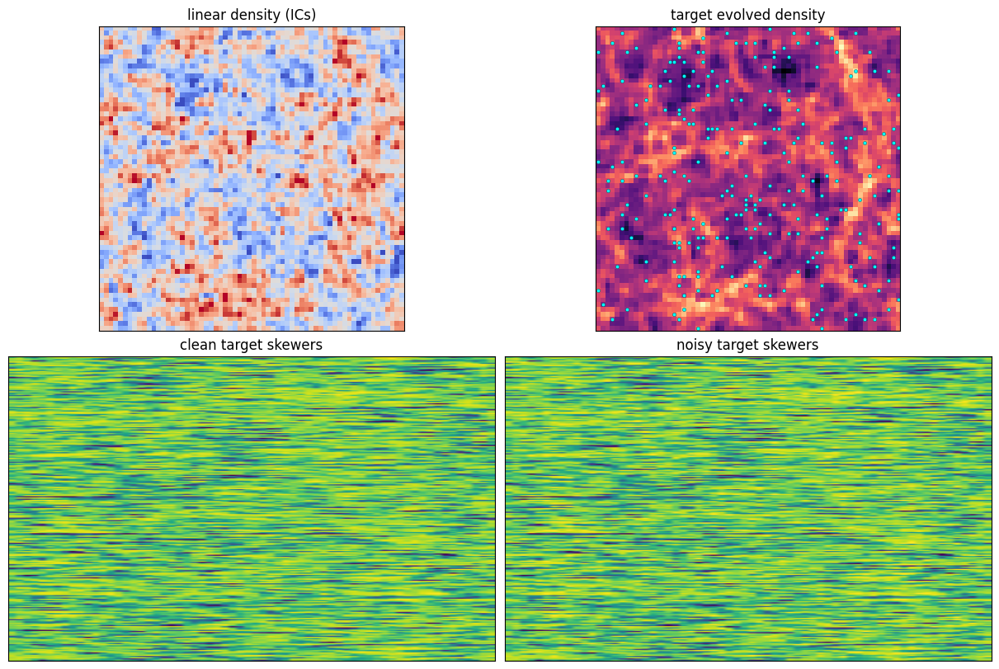

In [10]:
truth_linear, truth_delta_z_repro, truth_flux_repro = full_forward_model(true_modes, LOG_A_TRUE)
truth_clean_loss = 0.5 * jnp.sum((truth_flux_repro - true_flux) ** 2) / FLUX_SIGMA**2
truth_noisy_loss = 0.5 * jnp.sum((truth_flux_repro - noisy_flux) ** 2) / FLUX_SIGMA**2
truth_prior = active_prior_loss(position_from_modes_and_log_A(true_modes, LOG_A_TRUE)["modes"])
print(f"truth clean data loss={float(truth_clean_loss):.6e}")
print(f"truth noisy data loss={float(truth_noisy_loss):.6e}")
print(f"truth prior={float(truth_prior):.6e}")

linear_slice = np.asarray(truth_linear)[:, :, RES // 2]
linear_vmax = np.percentile(np.abs(linear_slice), 99)

fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
axes[0, 0].imshow(linear_slice.T, origin="lower", cmap="coolwarm", vmin=-linear_vmax, vmax=linear_vmax)
axes[0, 0].set_title("linear density (ICs)")
axes[0, 1].imshow(log_density_for_plot(np.asarray(true_delta_z)[:, :, RES // 2]).T, origin="lower", cmap="magma")
axes[0, 1].scatter(SK_X_NP, SK_Y_NP, s=10, c="cyan", edgecolors="black", linewidths=0.2)
axes[0, 1].set_title("target evolved density")
axes[1, 0].imshow(np.asarray(true_flux), aspect="auto", origin="lower", cmap="viridis", vmin=0, vmax=1)
axes[1, 0].set_title("clean target skewers")
axes[1, 1].imshow(np.asarray(noisy_flux), aspect="auto", origin="lower", cmap="viridis", vmin=0, vmax=1)
axes[1, 1].set_title("noisy target skewers")
for ax in axes.ravel():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

The linear density field shown in the upper left panel is the initial condition for the forward model, which is evolved into the target density field shown in the upper right panel. In Fourier space, the linear density contrast $\delta_\mathrm{lin}$ is related to the white-noise modes $\epsilon$ through a simple scaling by the square root of the linear power spectrum, $\delta_\mathrm{lin}(\mathbf{k}) = \sqrt{P_\mathrm{lin}(k)} \, \epsilon(\mathbf{k})$. The cyan points overplotted on the target density field show the locations of the skewers where the flux is observed.
The lower panels show stacks of the clean and noisy flux skewers extracted from the target density field using the Fluctuating Gunn-Peterson Approximation (FGPA), which relates $\delta$ to the transmitted flux $F$. Each row corresponds to one skewer, and the columns show the pixels along the skewer. The MAP/HMC inference will attempt to reconstruct $\epsilon$ and the `log_A` FGPA parameter starting only from the observed flux skewers and the forward model.

#### (Approximate) maximum a-posteriori (MAP) optimization with L-BFGS to find a good starting point for HMC

Before running HMC, we find an approximate MAP point by minimizing the negative log posterior with SciPy's `L-BFGS-B` optimizer. This is not intended to produce a fully converged scientific estimator; it provides a high-probability starting point that is much closer to the typical set than the initial random prior draw.

The optimization uses a diagonal field preconditioner based on the linear-theory power spectrum, together with a separate scaling for `log_A`, so that the optimizer sees coordinates with more comparable curvature. To make the high-dimensional problem easier, the MAP solve is staged in Fourier space: early stages optimize only low-$k$ active modes, and later stages progressively add smaller-scale modes until the full compact rFFT field is included. The same staged and preconditioned MAP strategy is described in more detail in `discodj_tesseract_example/embedded_tesseract`.


In [11]:
# Return active-mode indices included in one MAP k-cut stage.
def map_stage_indices_for_k_fraction(k_fraction):
    if not MAP_USE_STAGES or k_fraction >= 1.0:
        return jnp.arange(ACTIVE_MODE_INDICES.shape[0], dtype=jnp.int32)
    active_mode_indices = np.asarray(ACTIVE_MODE_INDICES)
    flat_k = K_GRID.reshape(-1)[active_mode_indices]
    k_cut = float(k_fraction) * float(np.asarray(arrays["k_nyquist"]))
    return jnp.asarray(np.nonzero(flat_k < k_cut)[0], dtype=jnp.int32)


MAP_STAGE_INDICES = [
    map_stage_indices_for_k_fraction(frac)
    for frac in (MAP_STAGE_K_FRACTIONS if MAP_USE_STAGES else (1.0,))
]
MAP_STAGE_MAXITERS_EFFECTIVE = MAP_STAGE_MAXITERS if MAP_USE_STAGES else (MAP_MAXITER,)
if len(MAP_STAGE_INDICES) != len(MAP_STAGE_MAXITERS_EFFECTIVE):
    raise ValueError("MAP_STAGE_K_FRACTIONS and MAP_STAGE_MAXITERS must have the same length")


# Build the optimizer preconditioner for all active MAP coordinates.
def make_map_active_preconditioner():
    precision_grid = (
        jnp.asarray(MAP_PRECONDITIONER_STRENGTH, dtype=FIELD_DTYPE)
        * LINEAR_POWER_GRID
        / jnp.asarray(N2, dtype=FIELD_DTYPE)
        + jnp.asarray(MAP_PRECONDITIONER_FLOOR, dtype=FIELD_DTYPE)
    )
    active_precision = precision_grid.reshape(-1)[ACTIVE_MODE_INDICES]
    active = active_precision * ACTIVE_PRIOR_WEIGHTS
    active = jnp.repeat(active, 2)
    lo, hi = MAP_PRECONDITIONER_CLIP
    return jnp.clip(active, jnp.asarray(lo, dtype=FIELD_DTYPE), jnp.asarray(hi, dtype=FIELD_DTYPE)).astype(FIELD_DTYPE)


MAP_ACTIVE_PRECONDITIONER = make_map_active_preconditioner()
print(
    "MAP active preconditioner | "
    f"enabled={MAP_USE_FIELD_PRECONDITIONER} "
    f"min={float(jnp.min(MAP_ACTIVE_PRECONDITIONER)):.3e} "
    f"median={float(jnp.median(MAP_ACTIVE_PRECONDITIONER)):.3e} "
    f"max={float(jnp.max(MAP_ACTIVE_PRECONDITIONER)):.3e}"
)


# Return optimizer preconditioner entries for one MAP stage.
def map_stage_preconditioner(stage_indices):
    coord_indices = (stage_indices[:, None] * 2 + jnp.arange(2, dtype=jnp.int32)[None, :]).reshape(-1)
    return MAP_ACTIVE_PRECONDITIONER[coord_indices]


# Extract one stage's active modes from the full compact active vector.
def map_stage_modes_from_full(full_active_modes, stage_indices):
    active = jnp.asarray(full_active_modes, dtype=FIELD_DTYPE).reshape((-1, 2))
    return active[stage_indices].reshape(-1)


# Replace one stage's active modes inside the full compact active vector.
def map_full_modes_with_stage(full_active_modes, stage_indices, stage_modes_flat):
    active = jnp.asarray(full_active_modes, dtype=FIELD_DTYPE).reshape((-1, 2))
    stage_modes = jnp.asarray(stage_modes_flat, dtype=FIELD_DTYPE).reshape((-1, 2))
    return active.at[stage_indices].set(stage_modes).reshape(-1)


# Convert physical stage modes into optimizer coordinates.
def map_stage_field_to_optimizer_coordinates(stage_modes_flat, stage_indices):
    stage_modes_flat = jnp.asarray(stage_modes_flat, dtype=FIELD_DTYPE)
    if MAP_USE_FIELD_PRECONDITIONER:
        return stage_modes_flat * jnp.sqrt(map_stage_preconditioner(stage_indices))
    return stage_modes_flat


# Convert optimizer coordinates back to physical stage modes.
def map_stage_field_from_optimizer_coordinates(field_vector, stage_indices):
    field_vector = jnp.asarray(field_vector, dtype=FIELD_DTYPE)
    if MAP_USE_FIELD_PRECONDITIONER:
        return field_vector / jnp.sqrt(map_stage_preconditioner(stage_indices))
    return field_vector


# Pack one MAP stage state into the vector passed to SciPy.
def map_vector_from_stage_state(full_active_modes, log_A, stage_indices):
    stage_modes = map_stage_modes_from_full(full_active_modes, stage_indices)
    field_vector = map_stage_field_to_optimizer_coordinates(stage_modes, stage_indices)
    theta = jnp.asarray((float(log_A) - LOG_A_INIT) / MAP_LOG_A_SCALE, dtype=FIELD_DTYPE)
    return np.concatenate([np.asarray(field_vector, dtype=np.float32), np.asarray([float(theta)], dtype=np.float32)])


# Unpack a SciPy vector into the compact position used by MAP/HMC.
def map_position_from_stage_vector(vector, base_full_active_modes, stage_indices):
    vector = jnp.asarray(vector, dtype=FIELD_DTYPE)
    theta = vector[-1]
    stage_modes = map_stage_field_from_optimizer_coordinates(vector[:-1], stage_indices)
    full_active_modes = map_full_modes_with_stage(base_full_active_modes, stage_indices, stage_modes)
    log_A = jnp.asarray(LOG_A_INIT, dtype=FIELD_DTYPE) + jnp.asarray(MAP_LOG_A_SCALE, dtype=FIELD_DTYPE) * theta
    return dict(modes=full_active_modes, log_A=log_A)


# Evaluate the MAP objective for one stage vector.
def map_loss_from_stage_vector(vector, observed_flux, base_full_active_modes, stage_indices):
    pos = map_position_from_stage_vector(vector, base_full_active_modes, stage_indices)
    modes = modes_from_position(pos)
    data_loss, prior_loss = objective_terms(modes, pos["log_A"], observed_flux)
    return total_loss(data_loss, prior_loss)


# Return printable MAP diagnostics for one stage vector.
def map_terms_from_stage_vector(vector, observed_flux, base_full_active_modes, stage_indices):
    pos = map_position_from_stage_vector(vector, base_full_active_modes, stage_indices)
    data_loss, prior_loss, logp, modes, log_A = loss_terms_from_position(pos, observed_flux)
    return dict(data=float(data_loss), prior=float(prior_loss), total=float(data_loss + PRIOR_SCALING * prior_loss), log_A=float(log_A), position=pos)


# Run one staged MAP optimization.
def run_map_stage(kind, observed_flux, base_position, stage_number, k_fraction, maxiter, stage_indices):
    base_full_active_modes = jnp.asarray(base_position["modes"], dtype=FIELD_DTYPE)
    x0 = map_vector_from_stage_state(base_full_active_modes, float(base_position["log_A"]), stage_indices)
    stage_prec = np.asarray(map_stage_preconditioner(stage_indices))
    print(
        f"{kind} MAP stage {stage_number} start | kfrac={k_fraction:.3f} "
        f"modes={len(stage_indices)} coords={len(x0) - 1} log_A={float(base_position['log_A']):.6f} "
        f"precond median={np.median(stage_prec):.3e}"
    )
    value_and_grad = jax.jit(
        jax.value_and_grad(lambda x: map_loss_from_stage_vector(x, observed_flux, base_full_active_modes, stage_indices))
    )
    trace = []

    # Record and print MAP stage diagnostics.
    def record(label, x):
        terms = map_terms_from_stage_vector(x, observed_flux, base_full_active_modes, stage_indices)
        trace.append(
            dict(
                stage=stage_number,
                k_fraction=float(k_fraction),
                n_modes=int(len(stage_indices)),
                n_coords=int(len(x) - 1),
                **{k: v for k, v in terms.items() if k != "position"},
            )
        )
        print(
            f"{kind} MAP stage {stage_number} {label} | log_A={terms['log_A']:.6f} "
            f"data={terms['data']:.6e} prior={terms['prior']:.6e} total={terms['total']:.6e}"
        )

    # Return SciPy-compatible objective value and gradient.
    def obj_grad(x):
        value, grad = value_and_grad(jnp.asarray(x, dtype=FIELD_DTYPE))
        return float(value), np.asarray(grad, dtype=np.float32)

    it = {"n": 0}

    # Periodically record optimizer progress.
    def callback(xk):
        it["n"] += 1
        if it["n"] == 1 or it["n"] % MAP_PROGRESS_EVERY == 0:
            record(f"iter={it['n']:03d}", xk)

    record("initial", x0)
    res = minimize(
        obj_grad,
        x0,
        method="L-BFGS-B",
        jac=True,
        callback=callback,
        options=dict(maxiter=maxiter, maxls=20, ftol=1e-8, gtol=1e-5),
    )
    record("final", res.x)
    terms = map_terms_from_stage_vector(res.x, observed_flux, base_full_active_modes, stage_indices)
    print(
        f"{kind} MAP stage {stage_number} done | success={res.success} "
        f"nit={res.nit} nfev={res.nfev} message={res.message}"
    )
    return terms["position"], dict(
        stage=stage_number,
        k_fraction=float(k_fraction),
        success=bool(res.success),
        nit=int(res.nit),
        nfev=int(res.nfev),
        message=str(res.message),
        trace=trace,
        **{k: v for k, v in terms.items() if k != "position"},
    )


# Return the cache path for one MAP stage.
def map_cache_path(kind, stage_number):
    return MAP_CACHE_DIR / f"{kind}_map_stage_{stage_number}.npz"


# Build metadata that uniquely identifies one MAP stage cache.
def map_cache_metadata(kind, stage_number, k_fraction, maxiter, stage_indices):
    return dict(
        kind=str(kind),
        stage_number=int(stage_number),
        k_fraction=float(k_fraction),
        maxiter=int(maxiter),
        map_log_A_scale=float(MAP_LOG_A_SCALE),
        prior_scaling=float(PRIOR_SCALING),
        map_use_field_preconditioner=bool(MAP_USE_FIELD_PRECONDITIONER),
        map_preconditioner_strength=float(MAP_PRECONDITIONER_STRENGTH),
        map_preconditioner_floor=float(MAP_PRECONDITIONER_FLOOR),
        map_preconditioner_clip=[float(MAP_PRECONDITIONER_CLIP[0]), float(MAP_PRECONDITIONER_CLIP[1])],
        full_stage_count=int(ACTIVE_MODE_INDICES.shape[0]),
        stage_count=int(len(stage_indices)),
        log_A_init=float(LOG_A_INIT),
        target_tag=TARGET_TAG,
        target_bundle=TARGET_BUNDLE_PATH.name,
        target_bundle_sha256=TARGET_BUNDLE_SHA256,
        run_tag=RUN_TAG,
        run_output_dir=str(RUN_OUTPUT_DIR.relative_to(EXAMPLE_DIR)),
        inference_dtype=str(np.dtype(np.float32)),
    )


# Compare stored MAP cache metadata with expected metadata.
def map_cache_metadata_matches(actual, expected):
    return actual == expected


# Save the completed MAP stage position and summary.
def save_map_stage_cache(kind, position, summary, metadata):
    if MAP_CACHE_MODE == "off":
        return
    MAP_CACHE_DIR.mkdir(parents=True, exist_ok=True)
    path = map_cache_path(kind, metadata["stage_number"])
    summary_for_json = dict(summary)
    summary_for_json.pop("position", None)
    np.savez_compressed(
        path,
        modes=np.asarray(position["modes"], dtype=np.float32),
        log_A=np.asarray(float(position["log_A"]), dtype=np.float32),
        metadata=np.asarray(json.dumps(metadata, sort_keys=True)),
        summary=np.asarray(json.dumps(summary_for_json, sort_keys=True)),
    )
    print(f"{kind} MAP stage {metadata['stage_number']} cache saved | {path}")


# Load a MAP stage cache if metadata matches.
def load_map_stage_cache(kind, stage_number, expected_metadata):
    if MAP_CACHE_MODE != "load_or_run":
        return None
    path = map_cache_path(kind, stage_number)
    if not path.exists():
        print(f"{kind} MAP stage {stage_number} cache miss | missing {path.name}")
        return None
    try:
        with np.load(path, allow_pickle=False) as cache:
            actual_metadata = json.loads(str(cache["metadata"]))
            if not map_cache_metadata_matches(actual_metadata, expected_metadata):
                print(f"{kind} MAP stage {stage_number} cache miss | metadata mismatch")
                return None
            summary = json.loads(str(cache["summary"]))
            position = dict(
                modes=jnp.asarray(cache["modes"], dtype=FIELD_DTYPE),
                log_A=jnp.asarray(float(cache["log_A"]), dtype=FIELD_DTYPE),
            )
    except (OSError, KeyError, ValueError, json.JSONDecodeError) as exc:
        print(f"{kind} MAP stage {stage_number} cache miss | {type(exc).__name__}: {exc}")
        return None
    print(f"{kind} MAP stage {stage_number} cache loaded | {path}")
    return position, summary


if MAP_CACHE_MODE not in {"off", "load_or_run", "overwrite"}:
    raise ValueError(f"unknown MAP_CACHE_MODE: {MAP_CACHE_MODE}")


# Run all MAP stages for one observation kind.
def run_map(kind):
    observed_flux = flux_target(kind)
    position = position_from_modes_and_log_A(start_modes, LOG_A_INIT)
    stage_summaries = []
    all_trace = []
    for stage_number, (k_fraction, maxiter, stage_indices) in enumerate(
        zip(MAP_STAGE_K_FRACTIONS if MAP_USE_STAGES else (1.0,), MAP_STAGE_MAXITERS_EFFECTIVE, MAP_STAGE_INDICES, strict=True)
    ):
        metadata = map_cache_metadata(kind, stage_number, k_fraction, maxiter, stage_indices)
        loaded = load_map_stage_cache(kind, stage_number, metadata)
        if loaded is None:
            position, summary = run_map_stage(kind, observed_flux, position, stage_number, k_fraction, maxiter, stage_indices)
            save_map_stage_cache(kind, position, summary, metadata)
        else:
            position, summary = loaded
        stage_summaries.append(summary)
        all_trace.extend(summary["trace"])
    final_summary = dict(stage_summaries[-1])
    final_summary["kind"] = kind
    final_summary["stage_summaries"] = stage_summaries
    final_summary["trace"] = all_trace
    print(
        f"{kind} MAP done | final_stage={stage_summaries[-1]['stage']} "
        f"success={stage_summaries[-1]['success']} log_A={final_summary['log_A']:.6f} "
        f"data={final_summary['data']:.6e} prior={final_summary['prior']:.6e} total={final_summary['total']:.6e}"
    )
    return position, final_summary

MAP active preconditioner | enabled=True min=7.464e+03 median=1.295e+04 max=1.000e+06


#### Run MAP optimization

In [12]:
if RUN_MAP and OBSERVATION_KINDS:
    _map_diag_position = position_from_modes_and_log_A(start_modes, LOG_A_INIT)
    _map_diag_observed = flux_target(OBSERVATION_KINDS[0])
    _map_diag_stage = MAP_STAGE_INDICES[0]
    _map_diag_x = map_vector_from_stage_state(_map_diag_position["modes"], float(_map_diag_position["log_A"]), _map_diag_stage)
    _map_diag_preconditioned_loss = float(
        map_loss_from_stage_vector(_map_diag_x, _map_diag_observed, _map_diag_position["modes"], _map_diag_stage)
    )
    _map_diag_data, _map_diag_prior = objective_terms(modes_from_position(_map_diag_position), _map_diag_position["log_A"], _map_diag_observed)
    _map_diag_raw_loss = float(total_loss(_map_diag_data, _map_diag_prior))
    print(
        "MAP preconditioner loss check | "
        f"raw={_map_diag_raw_loss:.6e} preconditioned={_map_diag_preconditioned_loss:.6e} "
        f"diff={_map_diag_preconditioned_loss - _map_diag_raw_loss:.3e}"
    )

map_positions = {}
map_summaries = {}
if RUN_MAP:
    for kind in OBSERVATION_KINDS:
        pos, summary = run_map(kind)
        map_positions[kind] = pos
        map_summaries[kind] = summary

MAP preconditioner loss check | raw=1.365311e+06 preconditioned=1.365311e+06 diff=0.000e+00
noisy MAP stage 0 cache miss | missing noisy_map_stage_0.npz
noisy MAP stage 0 start | kfrac=0.250 modes=1051 coords=2102 log_A=-0.223144 precond median=2.806e+05
noisy MAP stage 0 initial | log_A=-0.223144 data=1.296802e+06 prior=6.850945e+04 total=1.365311e+06
noisy MAP stage 0 final | log_A=-1.198824 data=3.193298e+05 prior=6.907105e+04 total=3.884008e+05
noisy MAP stage 0 done | success=False nit=80 nfev=92 message=STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT
noisy MAP stage 1 cache miss | missing noisy_map_stage_1.npz
noisy MAP stage 1 start | kfrac=0.500 modes=8535 coords=17070 log_A=-1.198824 precond median=6.427e+04
noisy MAP stage 1 initial | log_A=-1.198824 data=3.193299e+05 prior=6.907105e+04 total=3.884009e+05
noisy MAP stage 1 final | log_A=-1.053996 data=8.078643e+04 prior=7.018330e+04 total=1.509697e+05
noisy MAP stage 1 done | success=False nit=120 nfev=147 message=STOP: TOTAL NO.

Make a diagnostic plot of the MAP optimization history for each observation kind, showing the MAP log_A and the data/prior/total loss components, with vertical lines marking the stage boundaries if using staged optimization.

*NOTE:* The MAP optimization is not fully converged here; it is only intended to find a reasonable starting point for HMC.

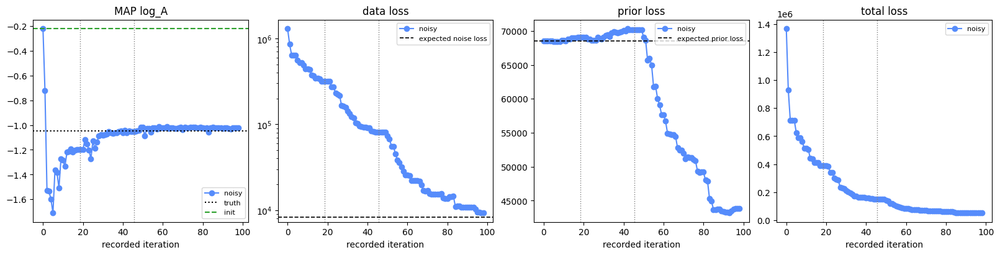

In [13]:
expected_data_loss = 0.5 * int(np.size(noisy_flux))
expected_prior_loss = 0.5 * float(np.sum(ACTIVE_PRIOR_WEIGHTS_NP))

if RUN_MAP:
    fig, axes = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True)
    for kind, summary in map_summaries.items():
        trace = summary["trace"]
        x = np.arange(len(trace))
        axes[0].plot(x, [t["log_A"] for t in trace], marker="o", label=kind)
        axes[1].semilogy(x, [t["data"] for t in trace], marker="o", label=kind)
        axes[2].plot(x, [t["prior"] for t in trace], marker="o", label=kind)
        axes[3].plot(x, [t["total"] for t in trace], marker="o", label=kind)
        stages = np.asarray([t["stage"] for t in trace])
        for boundary in np.where(stages[1:] != stages[:-1])[0] + 0.5:
            for ax in axes:
                ax.axvline(boundary, color="gray", ls=":", lw=1)
    axes[0].axhline(LOG_A_TRUE, color="black", ls=":", label="truth")
    axes[0].axhline(LOG_A_INIT, color="tab:green", ls="--", label="init")
    axes[1].axhline(expected_data_loss, color="black", ls="--", lw=1.2, label="expected noise loss")
    axes[2].axhline(expected_prior_loss, color="black", ls="--", lw=1.2, label="expected prior loss")
    for ax, title in zip(axes, ["MAP log_A", "data loss", "prior loss", "total loss"], strict=True):
        ax.set_title(title)
        ax.set_xlabel("recorded iteration")
        ax.legend(fontsize=8)
    plt.show()

The dashed horizontal line in the *data-loss* panel marks the expected value for a model whose residuals relative to the noisy target are just the observational noise. A sample at this level is therefore statistically consistent with the noisy truth. The dashed horizontal line in the *prior-loss* panel marks the expected prior loss for a typical prior draw; the MAP starting point for HMC has a lower-than-typical prior loss, so the HMC warm-up initially will have to move the chain away from that atypically compact point and into the posterior typical set.


#### Helper functions for HMC
Next, in order to draw samples $(\epsilon, \log A)$ from the posterior, we prepare the Hamiltonian Monte Carlo (HMC) run. HMC is an MCMC method that uses gradients of the target density to propose distant, high-probability moves through the posterior more efficiently than random-walk proposals. It does this by simulating Hamiltonian dynamics with a numerical integrator, then applies a Metropolis acceptance step to correct for the discretization error introduced by the approximate simulation

In [14]:
def atomic_savez(path, *, compressed=True, **arrays):
    path.parent.mkdir(parents=True, exist_ok=True)
    tmp_path = path.with_name(path.name + ".tmp")
    with open(tmp_path, "wb") as handle:
        save = np.savez_compressed if compressed else np.savez
        save(handle, **arrays)
    os.replace(tmp_path, path)


def flat_mask(position_template, leaf_name):
    mask_tree = jax.tree_util.tree_map(jnp.zeros_like, position_template)
    mask_tree = dict(mask_tree)
    mask_tree[leaf_name] = jnp.ones_like(position_template[leaf_name])
    mask, _ = ravel_pytree(mask_tree)
    return mask.astype(bool)


def log_A_flat_mask(position_template):
    return flat_mask(position_template, "log_A")


def modes_flat_mask(position_template):
    return flat_mask(position_template, "modes")


def analytic_field_inverse_mass():
    return 1.0 / ACTIVE_PRIOR_COORD_WEIGHTS.astype(FIELD_DTYPE)


def analytic_field_manual_log_A_inverse_mass(position_template):
    flat_position, _ = ravel_pytree(position_template)
    field_mask = modes_flat_mask(position_template)
    log_A_mask = log_A_flat_mask(position_template)
    field_inverse_mass = analytic_field_inverse_mass()
    if int(jnp.sum(field_mask)) != int(field_inverse_mass.size):
        raise ValueError("analytic field inverse mass does not match flattened field coordinates")

    inverse_mass = jnp.ones_like(flat_position, dtype=FIELD_DTYPE)
    inverse_mass = inverse_mass.at[field_mask].set(field_inverse_mass)
    return inverse_mass.at[log_A_mask].set(jnp.asarray(HMC_LOG_A_INVERSE_MASS, dtype=FIELD_DTYPE))


def production_inverse_mass(adapted_inverse_mass, position_template):
    adapted_inverse_mass = jnp.asarray(adapted_inverse_mass, dtype=FIELD_DTYPE)
    if HMC_MASS_MATRIX_MODE == "window_adapted":
        return adapted_inverse_mass
    raise ValueError(f"unknown adapted HMC_MASS_MATRIX_MODE: {HMC_MASS_MATRIX_MODE}")


def hmc_initial_position(kind):
    return map_positions[kind] if RUN_MAP else position_from_modes_and_log_A(start_modes, LOG_A_INIT)


def hmc_position_fingerprint(position):
    flat, _ = ravel_pytree(position)
    arr = np.ascontiguousarray(np.asarray(flat, dtype=np.float32))
    return hashlib.sha256(arr.view(np.uint8)).hexdigest()


def hmc_base_metadata(kind, initial_position):
    flat, _ = ravel_pytree(initial_position)
    return dict(
        kind=str(kind),
        target_tag=TARGET_TAG,
        target_bundle=TARGET_BUNDLE_PATH.name,
        target_bundle_sha256=TARGET_BUNDLE_SHA256,
        run_tag=RUN_TAG,
        run_output_dir=str(RUN_OUTPUT_DIR.relative_to(EXAMPLE_DIR)),
        inference_dtype=str(np.dtype(np.float32)),
        mass_matrix_mode=str(HMC_MASS_MATRIX_MODE),
        num_integration_steps=int(HMC_NUM_INTEGRATION_STEPS),
        prior_scaling=float(PRIOR_SCALING),
        position_size=int(flat.size),
        initial_position_fingerprint=hmc_position_fingerprint(initial_position),
    )


def hmc_adaptation_metadata(base_metadata):
    metadata = dict(base_metadata)
    metadata.update(
        warmup_steps=int(HMC_WARMUP_STEPS),
        initial_step_size=float(HMC_INITIAL_STEP_SIZE),
        target_acceptance=float(HMC_TARGET_ACCEPTANCE),
    )
    return metadata


def hmc_sample_metadata(base_metadata):
    metadata = dict(base_metadata)
    metadata.update(
        sample_steps=int(HMC_SAMPLE_STEPS),
        burn_in=int(HMC_BURN_IN),
        thin=int(HMC_THIN),
        warmup_steps=int(HMC_WARMUP_STEPS),
        initial_step_size=float(HMC_INITIAL_STEP_SIZE),
        target_acceptance=float(HMC_TARGET_ACCEPTANCE),
        fixed_step_size=float(HMC_FIXED_STEP_SIZE),
        log_A_inverse_mass=float(HMC_LOG_A_INVERSE_MASS),
        checkpoint_every=int(HMC_CHECKPOINT_EVERY),
    )
    return metadata


def hmc_cache_metadata_matches(actual, expected):
    return actual == expected


def hmc_adaptation_cache_path(kind):
    return HMC_ADAPTATION_CACHE_DIR / f"{kind}_hmc_adaptation.npz"


def hmc_sample_cache_path(kind):
    return HMC_SAMPLE_CACHE_DIR / f"{kind}_hmc_samples.npz"


def hmc_checkpoint_cache_path(kind, completed_step):
    return HMC_CHECKPOINT_CACHE_DIR / f"{kind}_hmc_checkpoint_{completed_step:06d}.npz"


def hmc_checkpoint_cache_paths(kind):
    return sorted(HMC_CHECKPOINT_CACHE_DIR.glob(f"{kind}_hmc_checkpoint_*.npz"), reverse=True)


def save_hmc_adaptation_cache(kind, state, step_size, adapted_mass, production_mass, metadata):
    if HMC_ADAPTATION_CACHE_MODE == "off" or HMC_MASS_MATRIX_MODE != "window_adapted":
        return
    path = hmc_adaptation_cache_path(kind)
    atomic_savez(
        path,
        compressed=True,
        modes=np.asarray(state.position["modes"], dtype=np.float32),
        log_A=np.asarray(float(state.position["log_A"]), dtype=np.float32),
        step_size=np.asarray(float(step_size), dtype=np.float32),
        adapted_inverse_mass=np.asarray(adapted_mass, dtype=np.float32),
        production_inverse_mass=np.asarray(production_mass, dtype=np.float32),
        metadata=np.asarray(json.dumps(metadata, sort_keys=True)),
    )
    print(f"{kind} HMC adaptation cache saved | {path}")


def load_hmc_adaptation_cache(kind, expected_metadata):
    if HMC_ADAPTATION_CACHE_MODE != "load_or_run" or HMC_MASS_MATRIX_MODE != "window_adapted":
        return None
    path = hmc_adaptation_cache_path(kind)
    if not path.exists():
        print(f"{kind} HMC adaptation cache miss | missing {path.name}")
        return None
    try:
        with np.load(path, allow_pickle=False) as cache:
            actual_metadata = json.loads(str(cache["metadata"]))
            if not hmc_cache_metadata_matches(actual_metadata, expected_metadata):
                print(f"{kind} HMC adaptation cache miss | metadata mismatch")
                return None
            position = dict(
                modes=jnp.asarray(cache["modes"], dtype=FIELD_DTYPE),
                log_A=jnp.asarray(float(cache["log_A"]), dtype=FIELD_DTYPE),
            )
            step_size = float(cache["step_size"])
            adapted_mass = jnp.asarray(cache["adapted_inverse_mass"], dtype=FIELD_DTYPE)
            production_mass = jnp.asarray(cache["production_inverse_mass"], dtype=FIELD_DTYPE)
    except (OSError, KeyError, ValueError, json.JSONDecodeError) as exc:
        print(f"{kind} HMC adaptation cache miss | {type(exc).__name__}: {exc}")
        return None
    print(f"{kind} HMC adaptation cache loaded | {path}")
    return position, step_size, adapted_mass, production_mass


def hmc_retained_indices(result):
    if result.get("samples_retained", False):
        return np.arange(len(result["modes"]))
    n = len(result["log_A"])
    burn = min(HMC_BURN_IN, max(0, n - 1))
    keep = np.arange(burn, n, HMC_THIN)
    return keep if keep.size else np.arange(n)


def hmc_production_retained_indices():
    burn = min(HMC_BURN_IN, max(0, HMC_SAMPLE_STEPS - 1))
    keep = np.arange(burn, HMC_SAMPLE_STEPS, HMC_THIN)
    return keep if keep.size else np.arange(HMC_SAMPLE_STEPS)


def hmc_mode_scalar_indices(result):
    if "retained_sample_indices" in result:
        return np.asarray(result["retained_sample_indices"], dtype=int)
    if len(result["modes"]) == len(result["log_A"]):
        return np.arange(len(result["modes"]))
    return hmc_production_retained_indices()[: len(result["modes"])]


def hmc_scalar_retained_indices(result):
    if result.get("samples_retained", False):
        indices = hmc_mode_scalar_indices(result)
        if len(result["log_A"]) == len(indices):
            return np.arange(len(indices))
        return indices
    return hmc_retained_indices(result)


def _empty_adapted_inverse_mass(adapted_inverse_mass):
    return np.asarray([], dtype=np.float32) if adapted_inverse_mass is None else np.asarray(adapted_inverse_mass, dtype=np.float32)


def hmc_result_from_traces(kind, traces, retained_sample_indices, step_size, adapted_inverse_mass, production_mass):
    return {k: np.asarray(v) for k, v in traces.items()} | dict(
        kind=kind,
        step_size=step_size,
        mass_matrix_mode=HMC_MASS_MATRIX_MODE,
        samples_retained=True,
        retained_sample_indices=np.asarray(retained_sample_indices, dtype=np.int64),
        adapted_inverse_mass=None if adapted_inverse_mass is None else np.asarray(adapted_inverse_mass),
        production_inverse_mass=np.asarray(production_mass),
    )


def hmc_trace_lists_from_result(result):
    keys = ["modes", "log_A", "data", "prior", "logp", "acceptance", "accepted", "divergent", "rms_truth"]
    return {k: list(np.asarray(result[k])) for k in keys}


def hmc_cache_arrays(result, metadata):
    mode_keep = hmc_retained_indices(result)
    return dict(
        modes=np.asarray(result["modes"][mode_keep], dtype=np.float32),
        retained_sample_indices=np.asarray(hmc_mode_scalar_indices(result)[mode_keep], dtype=np.int64),
        log_A=np.asarray(result["log_A"], dtype=np.float32),
        data=np.asarray(result["data"], dtype=np.float32),
        prior=np.asarray(result["prior"], dtype=np.float32),
        logp=np.asarray(result["logp"], dtype=np.float32),
        acceptance=np.asarray(result["acceptance"], dtype=np.float32),
        accepted=np.asarray(result["accepted"], dtype=bool),
        divergent=np.asarray(result["divergent"], dtype=bool),
        rms_truth=np.asarray(result["rms_truth"], dtype=np.float32),
        step_size=np.asarray(float(result["step_size"]), dtype=np.float32),
        adapted_inverse_mass=_empty_adapted_inverse_mass(result["adapted_inverse_mass"]),
        production_inverse_mass=np.asarray(result["production_inverse_mass"], dtype=np.float32),
        metadata=np.asarray(json.dumps(metadata, sort_keys=True)),
    )


def save_hmc_sample_cache(kind, result, metadata):
    if HMC_SAMPLE_CACHE_MODE == "off":
        return
    path = hmc_sample_cache_path(kind)
    arrays = hmc_cache_arrays(result, metadata)
    atomic_savez(path, compressed=True, **arrays)
    print(f"{kind} HMC sample cache saved | {path} retained={len(arrays['retained_sample_indices'])} scalars={len(arrays['log_A'])}")


def save_hmc_checkpoint_cache(kind, result, metadata, completed_step, key, state):
    if HMC_SAMPLE_CACHE_MODE == "off":
        return
    path = hmc_checkpoint_cache_path(kind, completed_step)
    arrays = hmc_cache_arrays(result, metadata)
    arrays.update(
        completed_step=np.asarray(int(completed_step), dtype=np.int64),
        key=np.asarray(key, dtype=np.uint32),
        checkpoint_modes=np.asarray(state.position["modes"], dtype=np.float32),
        checkpoint_log_A=np.asarray(float(state.position["log_A"]), dtype=np.float32),
    )
    atomic_savez(path, compressed=True, **arrays)
    print(f"{kind} HMC checkpoint saved | step={completed_step} retained={len(arrays['retained_sample_indices'])} path={path.name}")


def load_hmc_cached_result(path, kind, expected_metadata):
    with np.load(path, allow_pickle=False) as cache:
        actual_metadata = json.loads(str(cache["metadata"]))
        if not hmc_cache_metadata_matches(actual_metadata, expected_metadata):
            return None, "metadata mismatch"
        adapted_inverse_mass = np.asarray(cache["adapted_inverse_mass"])
        if adapted_inverse_mass.size == 0:
            adapted_inverse_mass = None
        retained_sample_indices = np.asarray(cache["retained_sample_indices"], dtype=np.int64) if "retained_sample_indices" in cache.files else np.arange(len(cache["modes"]), dtype=np.int64)
        result = dict(
            kind=str(kind),
            step_size=float(cache["step_size"]),
            mass_matrix_mode=str(HMC_MASS_MATRIX_MODE),
            samples_retained=True,
            retained_sample_indices=retained_sample_indices,
            modes=np.asarray(cache["modes"]),
            log_A=np.asarray(cache["log_A"]),
            data=np.asarray(cache["data"]),
            prior=np.asarray(cache["prior"]),
            logp=np.asarray(cache["logp"]),
            acceptance=np.asarray(cache["acceptance"]),
            accepted=np.asarray(cache["accepted"], dtype=bool),
            divergent=np.asarray(cache["divergent"], dtype=bool),
            rms_truth=np.asarray(cache["rms_truth"]),
            adapted_inverse_mass=adapted_inverse_mass,
            production_inverse_mass=np.asarray(cache["production_inverse_mass"]),
        )
    return result, None


def load_hmc_sample_cache(kind, expected_metadata):
    if HMC_SAMPLE_CACHE_MODE != "load_or_run":
        return None
    path = hmc_sample_cache_path(kind)
    if not path.exists():
        print(f"{kind} HMC sample cache miss | missing {path.name}")
        return None
    try:
        result, error = load_hmc_cached_result(path, kind, expected_metadata)
        if error is not None:
            print(f"{kind} HMC sample cache miss | {error}")
            return None
    except (OSError, KeyError, ValueError, json.JSONDecodeError) as exc:
        print(f"{kind} HMC sample cache miss | {type(exc).__name__}: {exc}")
        return None
    print(f"{kind} HMC sample cache loaded | {path} retained={len(result['modes'])} scalars={len(result['log_A'])}")
    return result


def load_latest_hmc_checkpoint_cache(kind, expected_metadata):
    if HMC_SAMPLE_CACHE_MODE != "load_or_run":
        return None
    for path in hmc_checkpoint_cache_paths(kind):
        try:
            result, error = load_hmc_cached_result(path, kind, expected_metadata)
            if error is not None:
                print(f"{kind} HMC checkpoint skip | {path.name}: {error}")
                continue
            with np.load(path, allow_pickle=False) as cache:
                completed_step = int(cache["completed_step"])
                key = jnp.asarray(cache["key"], dtype=jnp.uint32)
                position = dict(
                    modes=jnp.asarray(cache["checkpoint_modes"], dtype=FIELD_DTYPE),
                    log_A=jnp.asarray(float(cache["checkpoint_log_A"]), dtype=FIELD_DTYPE),
                )
        except (OSError, KeyError, ValueError, json.JSONDecodeError) as exc:
            print(f"{kind} HMC checkpoint skip | {path.name}: {type(exc).__name__}: {exc}")
            continue
        print(f"{kind} HMC checkpoint loaded | {path} completed_step={completed_step} retained={len(result['modes'])}")
        return completed_step, key, position, result
    return None

#### Run HMC sampling
Starting from the approximate MAP point, we now sample the posterior with Hamiltonian Monte Carlo using BlackJAX. The sampler targets the log posterior defined above, with the latent Fourier white-noise field $\epsilon$ and `log_A` as the sampled variables.

Before production sampling, the notebook runs BlackJAX window adaptation. During this warm-up phase, HMC tunes the leapfrog step size and a diagonal inverse mass matrix to reach the target acceptance rate and better match the local posterior geometry. These warm-up states are used only for adaptation, not as retained posterior samples.

After adaptation, the production chain is run for `HMC_SAMPLE_STEPS`. The first `HMC_BURN_IN` production transitions are discarded to reduce dependence on the MAP initialization, and the remaining chain is thinned by `HMC_THIN` before saving retained samples. During sampling we monitor the acceptance rate, divergences, data loss, prior loss, and `log_A`; persistent divergences or very low acceptance would indicate that the integration settings or mass matrix need attention.

In [15]:
if HMC_ADAPTATION_CACHE_MODE not in {"off", "load_or_run", "overwrite"}:
    raise ValueError(f"unknown HMC_ADAPTATION_CACHE_MODE: {HMC_ADAPTATION_CACHE_MODE}")
if HMC_SAMPLE_CACHE_MODE not in {"off", "load_or_run", "overwrite"}:
    raise ValueError(f"unknown HMC_SAMPLE_CACHE_MODE: {HMC_SAMPLE_CACHE_MODE}")
if HMC_CHECKPOINT_EVERY <= 0:
    raise ValueError("HMC_CHECKPOINT_EVERY must be positive")


def run_hmc(kind, key):
    observed_flux = flux_target(kind)
    initial_position = hmc_initial_position(kind)
    base_metadata = hmc_base_metadata(kind, initial_position)
    sample_metadata = hmc_sample_metadata(base_metadata)
    logdensity = lambda pos, obs=observed_flux: logdensity_from_position(pos, obs).astype(FIELD_DTYPE)
    if HMC_MASS_MATRIX_MODE == "analytic_field_manual_log_A":
        step_size = float(HMC_FIXED_STEP_SIZE)
        adapted_mass = None
        production_mass = analytic_field_manual_log_A_inverse_mass(initial_position)
        hmc = blackjax.hmc(logdensity, step_size=step_size, inverse_mass_matrix=production_mass, num_integration_steps=HMC_NUM_INTEGRATION_STEPS)
        state = hmc.init(initial_position)
    elif HMC_MASS_MATRIX_MODE == "window_adapted":
        adaptation_metadata = hmc_adaptation_metadata(base_metadata)
        loaded_adaptation = load_hmc_adaptation_cache(kind, adaptation_metadata)
        if loaded_adaptation is None:
            key, adapt_key = jax.random.split(key)
            adaptation = blackjax.window_adaptation(
                blackjax.hmc,
                logdensity,
                is_mass_matrix_diagonal=True,
                initial_step_size=HMC_INITIAL_STEP_SIZE,
                target_acceptance_rate=HMC_TARGET_ACCEPTANCE,
                num_integration_steps=HMC_NUM_INTEGRATION_STEPS,
                progress_bar=True,
                adaptation_info_fn=lambda state, info, adaptation_state: dict(acceptance_rate=info.acceptance_rate, is_divergent=info.is_divergent),
            )
            adaptation_result, adaptation_info = adaptation.run(adapt_key, initial_position, num_steps=HMC_WARMUP_STEPS)
            step_size = float(adaptation_result.parameters["step_size"])
            adapted_mass = adaptation_result.parameters["inverse_mass_matrix"]
            production_mass = production_inverse_mass(adapted_mass, initial_position)
            hmc = blackjax.hmc(logdensity, step_size=step_size, inverse_mass_matrix=production_mass, num_integration_steps=HMC_NUM_INTEGRATION_STEPS)
            state = adaptation_result.state
            save_hmc_adaptation_cache(kind, state, step_size, adapted_mass, production_mass, adaptation_metadata)
        else:
            warmup_position, step_size, adapted_mass, production_mass = loaded_adaptation
            hmc = blackjax.hmc(logdensity, step_size=step_size, inverse_mass_matrix=production_mass, num_integration_steps=HMC_NUM_INTEGRATION_STEPS)
            state = hmc.init(warmup_position)
    else:
        raise ValueError(f"unknown HMC_MASS_MATRIX_MODE: {HMC_MASS_MATRIX_MODE}")

    step = jax.jit(hmc.step)
    retained_steps = set((hmc_production_retained_indices() + 1).tolist())
    traces = dict(modes=[], log_A=[], data=[], prior=[], logp=[], acceptance=[], accepted=[], divergent=[], rms_truth=[])
    retained_sample_indices = []
    start_step = 0

    loaded_checkpoint = load_latest_hmc_checkpoint_cache(kind, sample_metadata)
    if loaded_checkpoint is not None:
        start_step, key, checkpoint_position, checkpoint_result = loaded_checkpoint
        state = hmc.init(checkpoint_position)
        traces = hmc_trace_lists_from_result(checkpoint_result)
        retained_sample_indices = list(np.asarray(checkpoint_result["retained_sample_indices"], dtype=np.int64))

    log_A_mask = np.asarray(log_A_flat_mask(initial_position), dtype=bool)
    production_log_A_mass = float(np.asarray(production_mass)[log_A_mask][0])
    if adapted_mass is None:
        print(
            f"{kind} HMC start | mass_mode={HMC_MASS_MATRIX_MODE} "
            f"from_step={start_step} log_A={float(state.position['log_A']):.6f} step={step_size:.3e} "
            f"production_inv_mass_log_A={production_log_A_mass:.3e}"
        )
    else:
        adapted_log_A_mass = float(np.asarray(adapted_mass)[log_A_mask][0])
        print(
            f"{kind} HMC start | mass_mode={HMC_MASS_MATRIX_MODE} "
            f"from_step={start_step} log_A={float(state.position['log_A']):.6f} step={step_size:.3e} "
            f"adapted_inv_mass_log_A={adapted_log_A_mass:.3e} "
            f"production_inv_mass_log_A={production_log_A_mass:.3e}"
        )

    for i in tqdm(range(start_step + 1, HMC_SAMPLE_STEPS + 1), desc=f"{kind} HMC"):
        key, subkey = jax.random.split(key)
        state, info = step(subkey, state)
        data, prior, logp, modes, log_A = loss_terms_from_position(state.position, observed_flux)
        traces["log_A"].append(float(log_A))
        traces["data"].append(float(data))
        traces["prior"].append(float(prior))
        traces["logp"].append(float(logp))
        traces["acceptance"].append(float(info.acceptance_rate))
        traces["accepted"].append(bool(info.is_accepted))
        traces["divergent"].append(bool(info.is_divergent))
        traces["rms_truth"].append(weighted_mode_rms(np.asarray(modes), np.asarray(true_modes)))
        if i in retained_steps:
            traces["modes"].append(np.asarray(modes, dtype=np.float32))
            retained_sample_indices.append(i - 1)
        if i == 1 or i % HMC_PROGRESS_EVERY == 0 or i == HMC_SAMPLE_STEPS:
            print(f"{kind} HMC step {i:04d}/{HMC_SAMPLE_STEPS} | log_A={float(log_A):.6f} data={float(data):.6e} prior={float(prior):.6e} acc={float(info.acceptance_rate):.3f} div={int(bool(info.is_divergent))}")
        if i % HMC_CHECKPOINT_EVERY == 0 or i == HMC_SAMPLE_STEPS:
            partial_result = hmc_result_from_traces(kind, traces, retained_sample_indices, step_size, adapted_mass, production_mass)
            save_hmc_checkpoint_cache(kind, partial_result, sample_metadata, i, key, state)

    adapted_inverse_mass = None if adapted_mass is None else np.asarray(adapted_mass)
    return hmc_result_from_traces(kind, traces, retained_sample_indices, step_size, adapted_inverse_mass, production_mass), key


hmc_results = []
if RUN_HMC:
    for kind in OBSERVATION_KINDS:
        initial_position = hmc_initial_position(kind)
        sample_metadata = hmc_sample_metadata(hmc_base_metadata(kind, initial_position))
        result = load_hmc_sample_cache(kind, sample_metadata)
        if result is None:
            result, key = run_hmc(kind, key)
            save_hmc_sample_cache(kind, result, sample_metadata)
        hmc_results.append(result)

noisy HMC sample cache miss | missing noisy_hmc_samples.npz
noisy HMC adaptation cache miss | missing noisy_hmc_adaptation.npz
Running window adaptation
noisy HMC adaptation cache saved | /home/flo/Documents/Projects/DiscoDJ-Tesseract-Demo/discodj_tesseract_example/enzyme_fgpa_loga/outputs/run_res_64_std_0p03_noisy_10_steps_final/hmc_adaptation_cache/noisy_hmc_adaptation.npz
noisy HMC start | mass_mode=window_adapted from_step=0 log_A=-1.014942 step=1.643e-02 adapted_inv_mass_log_A=5.581e-05 production_inv_mass_log_A=5.581e-05
noisy HMC: 100%|██████████| 5000/5000 [8:31:45<00:00,  6.14s/it]
noisy HMC step 5000/5000 | log_A=-1.027533 data=8.203555e+03 prior=6.862208e+04 acc=0.732 div=0
noisy HMC checkpoint saved | step=5000 retained=160 path=noisy_hmc_checkpoint_005000.npz
noisy HMC sample cache saved | /home/flo/Documents/Projects/DiscoDJ-Tesseract-Demo/discodj_tesseract_example/enzyme_fgpa_loga/outputs/run_res_64_std_0p03_noisy_10_steps_final/hmc_sample_cache/noisy_hmc_samples.npz ret

#### HMC analysis plots
These plots summarize the raw HMC production chain after adaptation. The `log_A` trace shows whether the global FGPA amplitude is exploring around the true value, while the data and prior losses indicate whether the chain has moved from the MAP initialization into the posterior typical set. For noisy data, the data loss should be roughly one half of the number of observed flux pixels, and the expected prior loss is approximately one half of the number of active prior-weighted degrees of freedom. The weighted RMS to the true field is only available in this controlled demo, where the latent truth is known; it is a diagnostic for this example rather than something available in real data analyses.

noisy | acc_all=0.881 div_all=0.000 log_A retained_mean=-1.041402 retained_std=6.244e-03 truth=-1.049822 data final_step=8.204e+03 prior final_step=6.862e+04 rms_truth final_step=1.376e+00


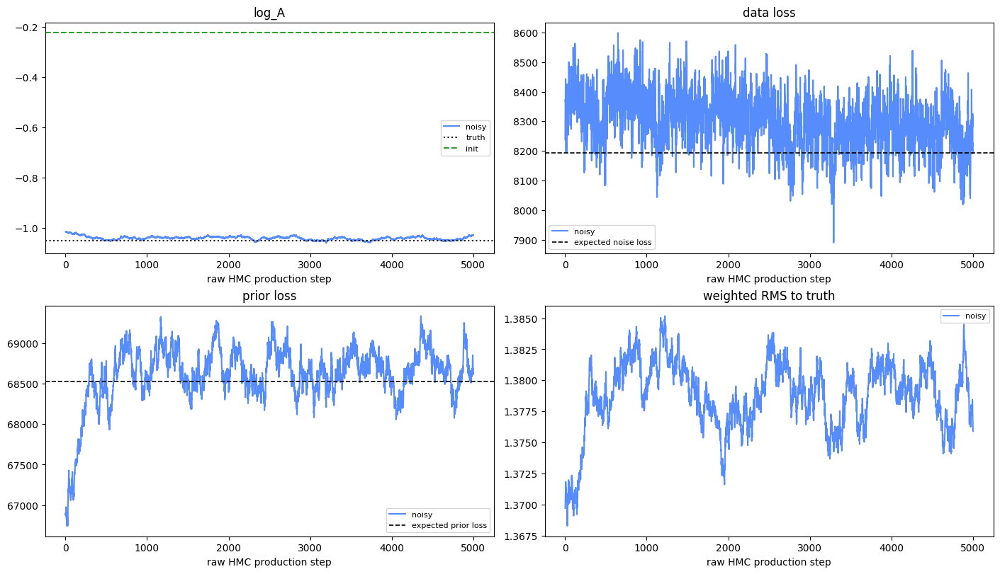

In [16]:
def retained_mode_indices(result):
    return hmc_retained_indices(result)


def retained_scalar_indices(result):
    return hmc_scalar_retained_indices(result)


for result in hmc_results:
    keep = retained_scalar_indices(result)
    print(
        f"{result['kind']} | acc_all={np.mean(result['acceptance']):.3f} div_all={np.mean(result['divergent']):.3f} "
        f"log_A retained_mean={np.mean(result['log_A'][keep]):.6f} retained_std={np.std(result['log_A'][keep]):.3e} truth={LOG_A_TRUE:.6f} "
        f"data final_step={result['data'][-1]:.3e} prior final_step={result['prior'][-1]:.3e} rms_truth final_step={result['rms_truth'][-1]:.3e}"
    )

expected_data_loss = 0.5 * int(np.size(noisy_flux))
expected_prior_loss = 0.5 * float(np.sum(ACTIVE_PRIOR_WEIGHTS_NP))

fig, axes = plt.subplots(2, 2, figsize=(14, 8), constrained_layout=True)
for result in hmc_results:
    x = np.arange(1, len(result["log_A"]) + 1)
    axes[0,0].plot(x, result["log_A"], label=result["kind"])
    axes[0,1].plot(x, result["data"], label=result["kind"])
    axes[1,0].plot(x, result["prior"], label=result["kind"])
    axes[1,1].plot(x, result["rms_truth"], label=result["kind"])
axes[0,0].axhline(LOG_A_TRUE, color="black", ls=":", label="truth")
axes[0,0].axhline(LOG_A_INIT, color="tab:green", ls="--", label="init")
axes[0,1].axhline(expected_data_loss, color="black", ls="--", lw=1.2, label="expected noise loss")
axes[1,0].axhline(expected_prior_loss, color="black", ls="--", lw=1.2, label="expected prior loss")
for ax, title in zip(axes.ravel(), ["log_A", "data loss", "prior loss", "weighted RMS to truth"], strict=True):
    ax.set_title(title); ax.set_xlabel("raw HMC production step"); ax.legend(fontsize=8)
plt.show()

#### Forward evolve some posterior samples

In [17]:
def draw_fields(result):
    mode_keep = retained_mode_indices(result)
    scalar_for_mode = hmc_mode_scalar_indices(result)[mode_keep]
    chosen_slots = np.linspace(0, mode_keep.size - 1, min(ANALYSIS_DRAWS, mode_keep.size), dtype=int)
    fluxes, linears, evolved = [], [], []
    for mode_idx, scalar_idx in tqdm(list(zip(mode_keep[chosen_slots], scalar_for_mode[chosen_slots], strict=True)), desc=f"forward draws {result['kind']}"):
        linear, delta_z, flux = full_forward_model(jnp.asarray(result["modes"][mode_idx], dtype=FIELD_DTYPE), float(result["log_A"][scalar_idx]))
        fluxes.append(np.asarray(flux)); linears.append(np.asarray(linear)); evolved.append(np.asarray(delta_z))
    return np.stack(fluxes), np.stack(linears), np.stack(evolved)

field_draws = {result["kind"]: draw_fields(result) for result in hmc_results}

forward draws noisy: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]


#### Plot some posterior predictive skewers and density slices
These posterior predictive plots show how the HMC samples reproduce the observed flux data and the underlying fields in this example. The top flux panels compare the clean target, noisy target, and posterior mean flux image, while the skewer plot overlays representative noisy target measurements with the posterior mean prediction along the same lines of sight. The density panels compare the true and posterior-mean linear and evolved density slices, with residual maps highlighting where the posterior mean differs from the known target field; the cyan points mark the skewer positions that constrain the reconstruction. Clearly, the posterior mean has less power than the target, which is expected, as the differences on smaller scales that are unconstrained by the few skewers average out over the different posterior samples.

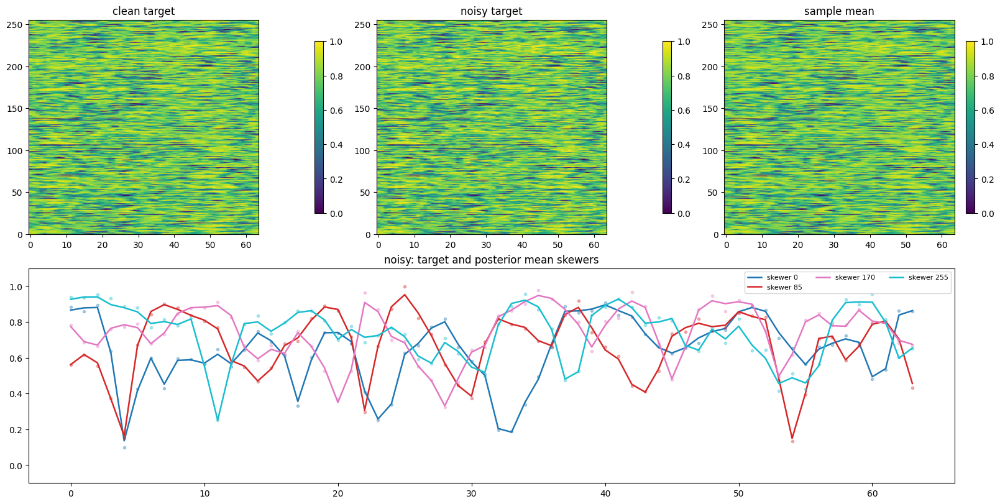

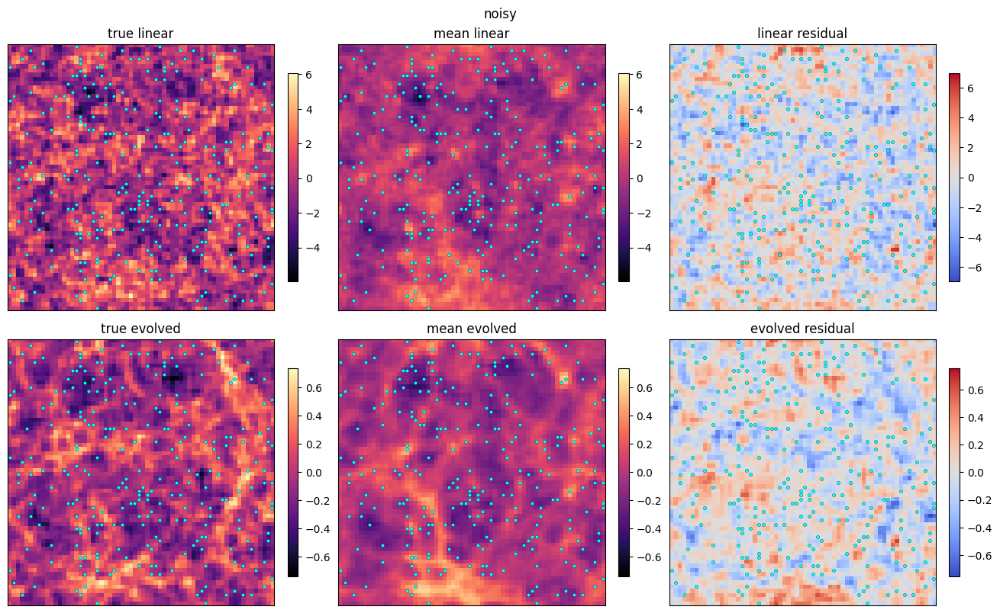

In [18]:
for result in hmc_results:
    kind = result["kind"]
    fluxes, linears, evolved = field_draws[kind]
    target = np.asarray(flux_target(kind))
    flux_mean = fluxes.mean(axis=0)
    fig = plt.figure(figsize=(16, 8), constrained_layout=True)
    gs = fig.add_gridspec(2, 3)
    for col, (image, title) in enumerate([(np.asarray(true_flux), "clean target"), (np.asarray(noisy_flux), "noisy target"), (flux_mean, "sample mean")]):
        ax = fig.add_subplot(gs[0, col])
        im = ax.imshow(image, aspect="auto", origin="lower", cmap="viridis", vmin=0, vmax=1)
        ax.set_title(title); fig.colorbar(im, ax=ax, shrink=0.8)
    ax = fig.add_subplot(gs[1, :])
    los = np.arange(RES)
    skewer_indices = np.linspace(0, len(SK_X_NP)-1, min(4, len(SK_X_NP)), dtype=int)
    colors = plt.cm.tab10(np.linspace(0.0, 1.0, len(skewer_indices)))
    for color, sk in zip(colors, skewer_indices, strict=True):
        ax.plot(los, target[sk], "o", color=color, ms=3, alpha=0.35)
        ax.plot(los, flux_mean[sk], color=color, lw=1.8, label=f"skewer {sk}")
    ax.set_ylim(-0.1, 1.1); ax.set_title(f"{kind}: target and posterior mean skewers"); ax.legend(ncols=3, fontsize=8)
    plt.show()

    true_linear = np.asarray(truth_linear)
    linear_mean = linears.mean(axis=0)
    mid = RES // 2
    true_evolved = log_density_for_plot(np.asarray(true_delta_z)[:, :, mid])
    evolved_mean = log_density_for_plot(evolved.mean(axis=0)[:, :, mid])

    linear_true_slice = true_linear[:, :, mid]
    linear_mean_slice = linear_mean[:, :, mid]
    linear_residual = linear_mean_slice - linear_true_slice
    linear_vmin = min(np.min(linear_true_slice), np.min(linear_mean_slice))
    linear_vmax = max(np.max(linear_true_slice), np.max(linear_mean_slice))
    linear_residual_vmax = np.max(np.abs(linear_residual))

    evolved_residual = evolved_mean - true_evolved
    evolved_vmin = min(np.min(true_evolved), np.min(evolved_mean))
    evolved_vmax = max(np.max(true_evolved), np.max(evolved_mean))
    evolved_residual_vmax = np.max(np.abs(evolved_residual))

    fig, axes = plt.subplots(2, 3, figsize=(13, 8), constrained_layout=True)
    panels = [
        (axes[0, 0], linear_true_slice, "true linear", "magma", linear_vmin, linear_vmax),
        (axes[0, 1], linear_mean_slice, "mean linear", "magma", linear_vmin, linear_vmax),
        (axes[0, 2], linear_residual, "linear residual", "coolwarm", -linear_residual_vmax, linear_residual_vmax),
        (axes[1, 0], true_evolved, "true evolved", "magma", evolved_vmin, evolved_vmax),
        (axes[1, 1], evolved_mean, "mean evolved", "magma", evolved_vmin, evolved_vmax),
        (axes[1, 2], evolved_residual, "evolved residual", "coolwarm", -evolved_residual_vmax, evolved_residual_vmax),
    ]
    for ax, image, title, cmap, vmin, vmax in panels:
        im = ax.imshow(image.T, origin="lower", cmap=cmap, vmin=vmin, vmax=vmax)
        ax.scatter(SK_X_NP, SK_Y_NP, s=10, c="cyan", edgecolors="black", linewidths=0.2)
        ax.set_title(title); ax.set_xticks([]); ax.set_yticks([]); fig.colorbar(im, ax=ax, shrink=0.75)
    fig.suptitle(kind)
    plt.show()

#### Brief Fourier analysis of the inferred linear density fields
We also plot the ratio of power spectrum and normalized cross-spectrum of the linear density samples w.r.t. the target. The power spectra of the samples are largely consistent with the target and on large scales correlated with the target. The posterior *mean*, while being somewhat more correlated with the target than the individual samples, loses power on smaller scales due to the averaging.

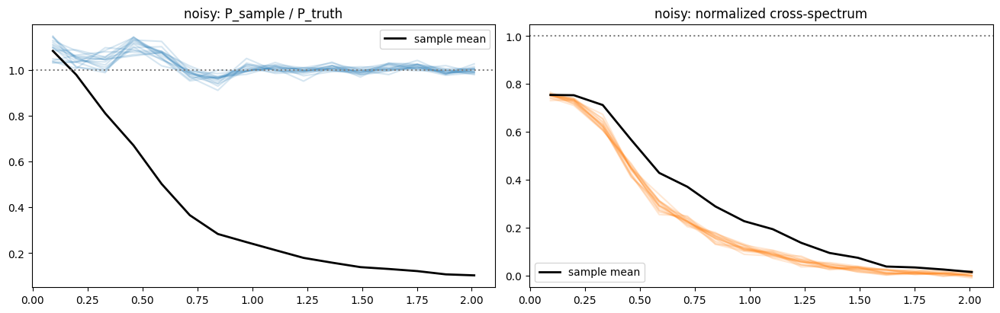

In [19]:
for result in hmc_results:
    kind = result["kind"]
    _, linears, _ = field_draws[kind]
    true_linear = np.asarray(truth_linear)
    linear_mean = linears.mean(axis=0)
    k, cross_mean, pk_mean, pk_truth = cross_power_spectrum(linear_mean, true_linear, cellsize=CELLSIZE, bins=FOURIER_BINS, with_jax=False, logarithmic=False)
    ratios, crosses = [], []
    for field in linears:
        _, cross_i, pk_i, pk_t = cross_power_spectrum(field, true_linear, cellsize=CELLSIZE, bins=FOURIER_BINS, with_jax=False, logarithmic=False)
        ratios.append(pk_i / np.maximum(pk_t, 1e-30)); crosses.append(cross_i)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4), constrained_layout=True)
    for ratio in ratios:
        axes[0].plot(k, ratio, color="tab:blue", alpha=0.18)
    axes[0].plot(k, pk_mean / np.maximum(pk_truth, 1e-30), color="black", lw=2, label="sample mean")
    axes[0].axhline(1, color="gray", ls=":"); axes[0].set_title(f"{kind}: P_sample / P_truth"); axes[0].legend()
    for cross in crosses:
        axes[1].plot(k, cross, color="tab:orange", alpha=0.18)
    axes[1].plot(k, cross_mean, color="black", lw=2, label="sample mean")
    axes[1].axhline(1, color="gray", ls=":"); axes[1].set_ylim(-0.05, 1.05); axes[1].set_title(f"{kind}: normalized cross-spectrum"); axes[1].legend()
    plt.show()

#### Make a GIF

In [20]:
def selected_draw_log_A(result):
    mode_keep = retained_mode_indices(result)
    scalar_for_mode = hmc_mode_scalar_indices(result)[mode_keep]
    chosen_slots = np.linspace(0, mode_keep.size - 1, min(ANALYSIS_DRAWS, mode_keep.size), dtype=int)
    return np.asarray(result["log_A"])[scalar_for_mode[chosen_slots]]


def save_density_gif(path, fluxes, evolved_fields, log_A_values, *, title=""):
    frames = []
    mid = RES // 2
    n_frames = min(len(fluxes), len(evolved_fields), len(log_A_values))
    target_image = log_density_for_plot(np.asarray(true_delta_z)[:, :, mid])
    draw_images = [log_density_for_plot(field[:, :, mid]) for field in evolved_fields[:n_frames]]
    draw_fluxes = np.asarray(fluxes[:n_frames])
    draw_log_A = np.asarray(log_A_values[:n_frames])
    vals = np.concatenate([target_image.ravel(), *[image.ravel() for image in draw_images]])
    vmin, vmax = np.percentile(vals, [1, 99])
    skewer_indices = np.linspace(0, len(SK_X_NP) - 1, min(3, len(SK_X_NP)), dtype=int)
    colors = plt.cm.tab10(np.linspace(0.3, 0.6, len(skewer_indices)))
    los = np.arange(RES)
    clean_target = np.asarray(true_flux)
    noisy_target = np.asarray(noisy_flux)
    for i, image in enumerate(draw_images):
        fig = plt.figure(figsize=(15, 5), constrained_layout=True)
        gs = fig.add_gridspec(3, 3, width_ratios=[1.0, 1.0, 1.35])
        density_axes = [fig.add_subplot(gs[:, 0]), fig.add_subplot(gs[:, 1])]
        skewer_axes = [fig.add_subplot(gs[row, 2]) for row in range(3)]

        density_panels = [(target_image, "target evolved density"), (image, f"{title} {i}")]
        for ax, (panel, panel_title) in zip(density_axes, density_panels, strict=True):
            ax.imshow(panel.T, origin="lower", cmap="magma", vmin=vmin, vmax=vmax)
            ax.scatter(SK_X_NP, SK_Y_NP, s=10, c="cyan", edgecolors="black", linewidths=0.2)
            ax.scatter(
                SK_X_NP[skewer_indices],
                SK_Y_NP[skewer_indices],
                s=70,
                c=colors,
                edgecolors="white",
                linewidths=1.2,
            )
            ax.set_title(panel_title)
            ax.set_xticks([])
            ax.set_yticks([])

        for row, (ax, color, sk) in enumerate(zip(skewer_axes, colors, skewer_indices, strict=True)):
            ax.plot(los, draw_fluxes[i, sk], color=color, lw=1.8, label="posterior sample")
            ax.plot(los, clean_target[sk], color=color, lw=1.0, ls="--", alpha=0.85, label="clean target")
            ax.plot(los, noisy_target[sk], "o", color=color, ms=3, alpha=0.35, label="noisy measurement")
            ax.axvline(mid, color="0.25", ls=":", lw=1.2, alpha=0.85, label="shown slice")
            ax.set_title(f"skewer {sk}", fontsize=10)
            ax.set_xlim(0, RES - 1)
            ax.set_ylim(-0.1, 1.1)
            ax.set_ylabel(r"Ly-$\alpha$ flux")
            if row < len(skewer_axes) - 1:
                ax.tick_params(labelbottom=False)
            else:
                ax.set_xlabel("cell along skewer")
                ax.text(
                    0.985,
                    0.08,
                    f"log A sample={draw_log_A[i]:.4f}  target={LOG_A_TRUE:.4f}",
                    transform=ax.transAxes,
                    ha="right",
                    va="bottom",
                    fontsize=8,
                    bbox=dict(facecolor="white", alpha=0.75, edgecolor="none", pad=2.0),
                )
            if row == 0:
                ax.legend(fontsize=7, loc="lower right")
        fig.canvas.draw()
        frame = np.asarray(fig.canvas.buffer_rgba())[..., :3]
        frames.append(Image.fromarray(frame))
        plt.close(fig)
    frames[0].save(path, save_all=True, append_images=frames[1:], duration=180, loop=0)

for result in hmc_results:
    kind = result["kind"]
    fluxes, _, evolved = field_draws[kind]
    log_A_values = selected_draw_log_A(result)
    n_frames = min(ANALYSIS_DRAWS, len(fluxes), len(evolved), len(log_A_values))
    save_density_gif(
        RUN_OUTPUT_DIR / f"{kind}_posterior_evolved_density.gif",
        fluxes[:n_frames],
        evolved[:n_frames],
        log_A_values[:n_frames],
        title=f"{kind} posterior",
    )
print("saved GIFs to", RUN_OUTPUT_DIR)

saved GIFs to /home/flo/Documents/Projects/DiscoDJ-Tesseract-Demo/discodj_tesseract_example/enzyme_fgpa_loga/outputs/run_res_64_std_0p03_noisy_10_steps_final


/home/flo/Documents/Projects/DiscoDJ-Tesseract-Demo/discodj_tesseract_example/enzyme_fgpa_loga/outputs/run_res_64_std_0p03_noisy_10_steps_final/noisy_posterior_evolved_density.gif


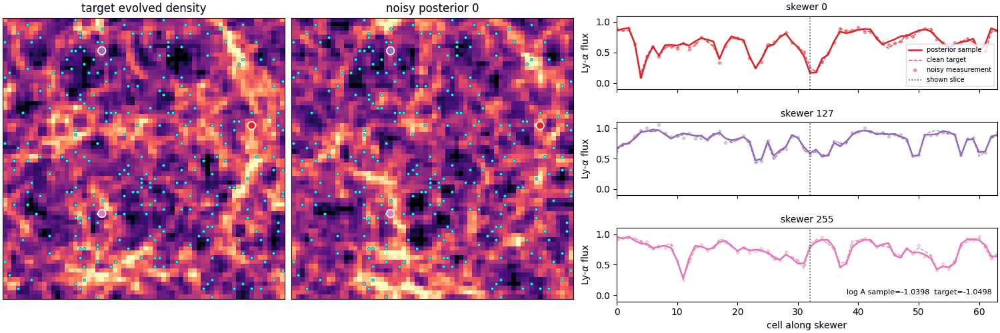

In [21]:
from IPython.display import Image as IPythonImage, display

for result in hmc_results:
    gif_path = RUN_OUTPUT_DIR / f"{result['kind']}_posterior_evolved_density.gif"
    if gif_path.exists():
        print(gif_path)
        display(IPythonImage(filename=str(gif_path)))
    else:
        print(f"missing GIF: {gif_path}")

The animation cycles through posterior draws after forward evolution to the density field (central panel). At the skewer locations, the samples are constrained by the observed flux and reproduce the skewer signal well (see right panel). Away from those lines of sight, the posterior remains much less constrained, so different samples can show substantially different density structure while still being consistent with the data.

#### Interactive 3D figure

In [22]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def plotly_volume_values(field, *, stride):
    return log_density_for_plot(np.asarray(field))[::stride, ::stride, ::stride].astype(np.float32, copy=False)


def plotly_volume_grid(shape):
    xx, yy, zz = np.mgrid[:shape[0], :shape[1], :shape[2]]
    return xx.ravel(), yy.ravel(), zz.ravel()


def plotly_skewer_trace(*, stride, scene, name, color="cyan", opacity=0.38):
    xs, ys, zs = [], [], []
    z_line = np.arange(0, RES, stride, dtype=np.float32) / stride
    for x, y in zip(SK_X_NP, SK_Y_NP, strict=True):
        xs.extend([x / stride] * len(z_line) + [None])
        ys.extend([y / stride] * len(z_line) + [None])
        zs.extend(z_line.tolist() + [None])
    return go.Scatter3d(
        x=xs,
        y=ys,
        z=zs,
        mode="lines",
        line=dict(color=color, width=1.5),
        opacity=opacity,
        name=name,
        showlegend=False,
        scene=scene,
    )


def plotly_density_volume(values, *, x_flat, y_flat, z_flat, vmin, vmax, name, scene, showscale=False):
    return go.Volume(
        x=x_flat,
        y=y_flat,
        z=z_flat,
        value=values.ravel(),
        isomin=float(vmin),
        isomax=float(vmax),
        cmin=float(vmin),
        cmax=float(vmax),
        cauto=False,
        opacity=0.075,
        surface_count=12,
        colorscale="Magma",
        caps=dict(x_show=False, y_show=False, z_show=False),
        colorbar=dict(title="log density", len=0.58),
        showscale=showscale,
        name=name,
        scene=scene,
    )


def posterior_3d_density_animation(kind, *, volume_stride=2):
    _, _, evolved = field_draws[kind]
    n_frames = min(ANALYSIS_DRAWS, len(evolved))
    target_values = plotly_volume_values(true_delta_z, stride=volume_stride)
    posterior_values = [plotly_volume_values(field, stride=volume_stride) for field in evolved[:n_frames]]
    vmin, vmax = np.percentile(
        np.concatenate([target_values.ravel(), *[values.ravel() for values in posterior_values]]),
        [70.0, 99.7],
    )
    x_flat, y_flat, z_flat = plotly_volume_grid(target_values.shape)

    fig = make_subplots(
        rows=1,
        cols=2,
        specs=[[{"type": "scene"}, {"type": "scene"}]],
        subplot_titles=("target evolved density", f"{kind} posterior evolved density"),
        horizontal_spacing=0.02,
    )
    fig.add_trace(
        plotly_density_volume(
            target_values,
            x_flat=x_flat,
            y_flat=y_flat,
            z_flat=z_flat,
            vmin=vmin,
            vmax=vmax,
            name="target",
            scene="scene",
            showscale=False,
        ),
        row=1,
        col=1,
    )
    fig.add_trace(
        plotly_density_volume(
            posterior_values[0],
            x_flat=x_flat,
            y_flat=y_flat,
            z_flat=z_flat,
            vmin=vmin,
            vmax=vmax,
            name="posterior draw 0",
            scene="scene2",
            showscale=True,
        ),
        row=1,
        col=2,
    )
    fig.add_trace(plotly_skewer_trace(stride=volume_stride, scene="scene", name="target skewers"), row=1, col=1)
    fig.add_trace(plotly_skewer_trace(stride=volume_stride, scene="scene2", name="posterior skewers"), row=1, col=2)

    fig.frames = [
        go.Frame(
            name=str(i),
            data=[
                plotly_density_volume(
                    values,
                    x_flat=x_flat,
                    y_flat=y_flat,
                    z_flat=z_flat,
                    vmin=vmin,
                    vmax=vmax,
                    name=f"posterior draw {i}",
                    scene="scene2",
                    showscale=True,
                )
            ],
            traces=[1],
            layout=go.Layout(title_text=f"3D evolved density posterior draw {i + 1}/{n_frames}"),
        )
        for i, values in enumerate(posterior_values)
    ]

    camera = dict(eye=dict(x=1.55, y=1.20, z=0.85), up=dict(x=0.0, y=1.0, z=0.0))
    scene_style = dict(
        aspectmode="cube",
        camera=camera,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
    )
    slider_steps = [
        dict(
            method="animate",
            label=str(i),
            args=[[str(i)], dict(mode="immediate", frame=dict(duration=0, redraw=True), transition=dict(duration=0))],
        )
        for i in range(n_frames)
    ]
    fig.update_layout(
        title=f"3D evolved density posterior draw 1/{n_frames}",
        width=1180,
        height=640,
        margin=dict(l=0, r=0, t=65, b=0),
        scene=scene_style,
        scene2=scene_style,
        updatemenus=[
            dict(
                type="buttons",
                showactive=False,
                x=0.08,
                y=0.0,
                xanchor="right",
                yanchor="top",
                buttons=[
                    dict(
                        label="Play",
                        method="animate",
                        args=[None, dict(frame=dict(duration=450, redraw=True), transition=dict(duration=0), fromcurrent=True)],
                    ),
                    dict(
                        label="Pause",
                        method="animate",
                        args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate", transition=dict(duration=0))],
                    ),
                ],
            )
        ],
        sliders=[dict(active=0, currentvalue=dict(prefix="draw "), steps=slider_steps)],
    )
    fig.show()


for result in hmc_results:
    posterior_3d_density_animation(result["kind"])

#### Brief analysis of the $\log A$ posterior, marginalized over the fields

In [23]:
def effective_sample_size_1d(values):
    values = np.asarray(values, dtype=np.float64)
    n = values.size
    if n < 2:
        return float(n)
    centered = values - np.mean(values)
    variance = np.dot(centered, centered)
    if variance <= 0.0:
        return float(n)
    autocorr = np.correlate(centered, centered, mode="full")[n - 1 :] / variance
    positive_lags = []
    for rho in autocorr[1:]:
        if rho <= 0.0:
            break
        positive_lags.append(float(rho))
    ess = n / (1.0 + 2.0 * np.sum(positive_lags))
    return float(np.clip(ess, 1.0, n))


for result in hmc_results:
    keep = retained_scalar_indices(result)
    retained_log_A = np.asarray(result["log_A"])[keep]
    retained_mean = float(np.mean(retained_log_A))
    retained_std = float(np.std(retained_log_A, ddof=1)) if retained_log_A.size > 1 else float("nan")
    truth_minus_mean = float(LOG_A_TRUE - retained_mean)
    offset_sigma = abs(truth_minus_mean) / retained_std if retained_std > 0.0 else float("nan")
    effective_n = effective_sample_size_1d(retained_log_A)
    print(f"{result['kind']} HMC log_A posterior summary")
    print(f"  truth log_A      = {LOG_A_TRUE: .9f}")
    print(f"  retained n       = {retained_log_A.size:d}")
    print(f"  effective n      = {effective_n: .2f}")
    print(f"  retained mean    = {retained_mean: .9f}")
    print(f"  retained std     = {retained_std: .9f}")
    print(f"  truth - mean     = {truth_minus_mean: .9f}")
    print(f"  offset           = {offset_sigma: .2f} sigma")

noisy HMC log_A posterior summary
  truth log_A      = -1.049822092
  retained n       = 160
  effective n      =  22.34
  retained mean    = -1.041401722
  retained std     =  0.006263527
  truth - mean     = -0.008420370
  offset           =  1.34 sigma


The marginal posterior for `log_A` is concentrated close to the chosen truth. For this noisy realization, the retained posterior mean is offset from the true value by about $1.3\sigma$, which is well within the expected scatter. The effective sample size is much smaller than the number of retained samples, indicating residual autocorrelation in this high-dimensional chain. For a production run, one should therefore run the HMC chain longer to obtain a larger effective sample size, or try to reduce the autocorrelation of the chain (e.g. by using more leapfrog integration steps).

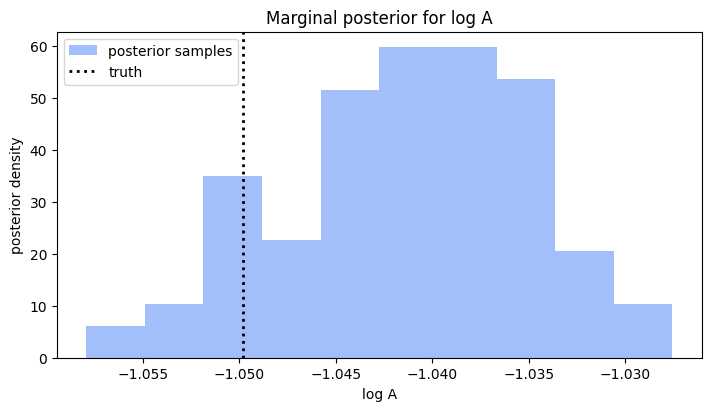

In [24]:
fig, ax = plt.subplots(figsize=(7, 4), constrained_layout=True)
for result in hmc_results:
    keep = retained_scalar_indices(result)
    retained_log_A = np.asarray(result["log_A"])[keep]
    ax.hist(retained_log_A, bins="auto", density=True, alpha=0.55, label="posterior samples")
ax.axvline(LOG_A_TRUE, color="black", ls=":", lw=2.0, label="truth")
ax.set_xlabel("log A")
ax.set_ylabel("posterior density")
ax.set_title("Marginal posterior for log A")
ax.legend()
plt.show()